In [1]:
### Modify on Jan.17th by Chuyan, actual 'LWP_yr_bin' versus. predicted "LWP_predi_yr_bin" :

import netCDF4
from numpy import *
import matplotlib.pyplot as plt
import xarray as xr
import PyNIO as Nio
import pandas as pd
import glob
from scipy.stats import *
from sklearn import linear_model
from sklearn.metrics import mean_squared_error, r2_score
from matplotlib.ticker import MaxNLocator
from matplotlib.colors import BoundaryNorm

from area_mean import *
from binned_cyFunctions5 import *
from read_hs_file import read_var_mod
from get_LWPCMIP6data import *
from get_annual_so import *
from calc_LRM_metrics import *
from fitLRM_cy import *
from run_simple_cmip6 import *
from calc_slope import *


In [2]:
wpath1 = '/glade/work/chuyan/Research/Cloud_CCFs_RMs/plots_test1/'

In [71]:
##  read data:

#..deck_nas = ['BCCESM1', 'CanESM5', 'CESM2', 'CESM2FV2', 'CESM2WACCM', 'CNRMESM2', 'E3SM10', 'GFDLCM4', 'GISSE21G', 'GISSE21H', 'IPSLCM6ALR', 'MRIESM20', 'MIROC6', 'SAM0']
deck_nas   =   ['BCCESM1', 'CanESM5', 'CESM2', 'CESM2FV2', 'CESM2WACCM', 'CNRMESM2', 'GISSE21G', 'GISSE21H', 'IPSLCM6ALR', 'MRIESM20', 'MIROC6', 'SAM0' ]

exp = 'abrupt-4xCO2'
SAM0 = {'modn': 'SAM0-UNICON', 'consort': 'SNU', 'cmip': 'cmip6',
            'exper': exp, 'ensmem': 'r1i1p1f1', 'gg': 'gn', "typevar": 'Amon'}
GISSE21G = {'modn': 'GISS-E2-1-G', 'consort': 'NASA-GISS', 'cmip': 'cmip6',
            'exper': exp, 'ensmem': 'r1i1p1f1', 'gg': 'gn', "typevar": 'Amon'}
CESM2 = {'modn': 'CESM2', 'consort': 'NCAR', 'cmip': 'cmip6',
         'exper': exp, 'ensmem': 'r1i1p1f1', 'gg': 'gn', "typevar": 'Amon'}

if (exp=='piControl')|(exp=='amip'):

    MIROC6 = {'modn': 'MIROC6', 'consort': 'MIROC', 'cmip': 'cmip6',
          'exper': exp, 'ensmem': 'r2i1p1f1', 'gg': 'gn', "typevar": 'Amon'}
    CAMSCSM1 = {'modn': 'CAMS-CSM1-0', 'consort': 'CAMS', 'cmip': 'cmip6',
            'exper': exp, 'ensmem': 'r1i1p1f1', 'gg': 'gn', "typevar": 'Amon'}

CESM2FV2 = {'modn': 'CESM2-FV2', 'consort': 'NCAR', 'cmip': 'cmip6',
         'exper': exp, 'ensmem': 'r1i1p1f1', 'gg': 'gn', "typevar": 'Amon'}

GISSE21H = {'modn': 'GISS-E2-1-H', 'consort': 'NASA-GISS', 'cmip': 'cmip6',
            'exper': exp, 'ensmem': 'r1i1p1f1', 'gg': 'gn', "typevar": 'Amon'}

CESM2WACCM = {'modn': 'CESM2-WACCM', 'consort': 'NCAR', 'cmip': 'cmip6',
         'exper': exp, 'ensmem': 'r1i1p1f1', 'gg': 'gn', "typevar": 'Amon'}
HADGEM3 = {'modn': 'HadGEM3-GC31-LL', 'consort': 'MOHC', 'cmip': 'cmip6',
           'exper': exp, 'ensmem': 'r1i1p1f3', 'gg': 'gn', "typevar": 'Amon'}   #  Be careful, failure due to 'day time representation'
UKESM10 = {'modn': 'UKESM1-0-LL', 'consort': 'MOHC', 'cmip': 'cmip6',
           'exper': exp, 'ensmem': 'r1i1p1f2', 'gg': 'gn', "typevar": 'Amon'}   # the same day time representation issue as 'HadGem3', dont have 'wap' variable in 'pi-Control' exp
IPSLCM6ALR = {'modn': 'IPSL-CM6A-LR', 'consort': 'IPSL', 'cmip': 'cmip6',
              'exper': exp, 'ensmem': 'r1i1p1f1', 'gg': 'gr', "typevar": 'Amon'}
CNRMCM6 = {'modn': 'CNRM-CM6-1', 'consort': 'CNRM-CERFACS', 'cmip': 'cmip6',
           'exper': exp, 'ensmem': 'r1i1p1f2', 'gg': 'gr', "typevar": 'Amon'}# time doesn't corresponding for 'evspsbl' in  'pi-Control' exper

CNRMESM2 = {'modn': 'CNRM-ESM2-1', 'consort': 'CNRM-CERFACS', 'cmip': 'cmip6', 
           'exper': exp, 'ensmem': 'r1i1p1f2', 'gg': 'gr', "typevar": 'Amon'}
MIROC6 = {'modn': 'MIROC6', 'consort': 'MIROC', 'cmip': 'cmip6',
          'exper': exp, 'ensmem': 'r1i1p1f1', 'gg': 'gn', "typevar": 'Amon'}
MIROCES2L= {'modn': 'MIROC-ES2L', 'consort': 'MIROC', 'cmip': 'cmip6',
          'exper': exp, 'ensmem': 'r1i1p1f2', 'gg': 'gn', "typevar": 'Amon'}#


GFDLCM4 = {'modn': 'GFDL-CM4', 'consort': 'NOAA-GFDL', 'cmip': 'cmip6',
           'exper': exp, 'ensmem': 'r1i1p1f1', 'gg': 'gr1', "typevar": 'Amon'}# missing lots of Variables
BCCESM1 = {'modn': 'BCC-ESM1', 'consort': 'BCC', 'cmip': 'cmip6',
           'exper': exp, 'ensmem': 'r1i1p1f1', 'gg': 'gn', "typevar": 'Amon'}
ACCESSCM2 = {'modn': 'ACCESS-CM2', 'consort': 'CSIRO-ARCCSS', 'cmip': 'cmip6',
             'exper': exp, 'ensmem': 'r1i1p1f1', 'gg': 'gn', "typevar": 'Amon'}#..'/glade/' don't have 'Amon' typevar
CAMSCSM1 = {'modn': 'CAMS-CSM1-0', 'consort': 'CAMS', 'cmip': 'cmip6',
            'exper': exp, 'ensmem': 'r2i1p1f1', 'gg': 'gn', "typevar": 'Amon'}#  abrupt4x exper doesnt have 'ps' variable in r1i1p1f1
MPIESM12LR = {'modn': 'MPI-ESM1-2-LR', 'consort': 'MPI-M', 'cmip': 'cmip6',
              'exper': exp, 'ensmem': 'r1i1p1f1', 'gg': 'gn', "typevar": 'Amon'}#..'/glade/' dont have 'Amon' typevar
CanESM5 = {'modn': 'CanESM5', 'consort': 'CCCma', 'cmip': 'cmip6',
           'exper': exp, 'ensmem': 'r1i1p1f1', 'gg': 'gn', "typevar": 'Amon'}
INM_CM48 = {'modn': 'INM-CM4-8', 'consort': 'INM', 'cmip': 'cmip6',
            'exper': exp, 'ensmem': 'r1i1p1f1', 'gg': 'gr1', "typevar": 'Amon'}#..'/glade/' dont have 'Amon' typevar
INM_CM50 = {'modn': 'INM-CM5-0', 'consort': 'INM', 'cmip': 'cmip6',
            'exper': exp, 'ensmem': 'r1i1p1f1', 'gg': 'gr1', "typevar": 'Amon'}#..'/glade/' dont have 'Amon' typevar

NORESM2LM = {'modn': 'NorESM2-LM', 'consort': 'NCC', 'cmip': 'cmip6',
             'exper': exp, 'ensmem': 'r1i1p1f1', 'gg': 'gn', "typevar": 'Amon'}# missing a lot of variables and typevars
E3SM10 = {'modn': 'E3SM-1-0', 'consort': 'E3SM-Project', 'cmip': 'cmip6',
          'exper': exp, 'ensmem': 'r1i1p1f1', 'gg': 'gr', "typevar": 'Amon'}# time doesnt corresponding, lose a lot of files for different variables in both exper
AWICM11MR = {'modn': 'AWI-CM-1-1-MR', 'consort': 'AWI', 'cmip': 'cmip6',
             'exper': exp, 'ensmem': 'r1i1p1f1', 'gg': 'gn', "typevar": 'Amon'}#..'/glade/' dont have 'tas' variable
CMCC = {'modn': 'CMCC-CM2-SR5', 'consort': 'CMCC', 'cmip': 'cmip6',
        'exper': exp, 'ensmem': 'r1i1p1f1', 'gg': 'gn', "typevar": 'Amon'} #..'/glade/' dont have 'abrupt-4xCO2'/'piControl' exper
ECE = {'modn': 'EC-Earth3', 'consort': 'EC-Earth-Consortium', 'cmip': 'cmip6',
       'exper': exp, 'ensmem': 'r1i1p1f1', 'gg': 'gn', "typevar": 'Amon'} #..dont have 'Amon' or variable 'tas'
#ECE has different variants for exper
ECEV = {'modn': 'EC-Earth3-Veg', 'consort': 'EC-Earth-Consortium', 'cmip': 'cmip6',
       'exper': exp, 'ensmem': 'r1i1p1f1', 'gg': 'gr', "typevar": 'Amon'}#..too hard to operate

#ECEV has very discrete year in 'abrupt-4xCO2', semms continued but each in one yr file in 'piControl'
MRIESM20 = {'modn': 'MRI-ESM2-0', 'consort': 'MRI', 'cmip': 'cmip6',
            'exper': exp, 'ensmem': 'r1i1p1f1', 'gg': 'gn', "typevar": 'Amon'}
FGOALSg3 = {'modn': 'FGOALS-g3', 'consort': 'CAS', 'cmip': 'cmip6',
            'exper': exp, 'ensmem': 'r1i1p1f1', 'gg': 'gn', "typevar": 'Amon'}# '/glade/' dont have 'Amon' typever in 'abru4x'


#..deck  = [BCCESM1, CanESM5, CESM2, CESM2FV2, CESM2WACCM, CNRMESM2, E3SM10, GFDLCM4, GISSE21G, GISSE21H, IPSLCM6ALR, MRIESM20, MIROC6, SAM0]
deck2    =  [BCCESM1, CanESM5, CESM2, CESM2FV2, CESM2WACCM, CNRMESM2, GISSE21G, GISSE21H, IPSLCM6ALR, MRIESM20, MIROC6, SAM0 ]

output_4lrm_ARRAY = {}
output_4lrm_intermedia = {}
output_4lrm_GMT =  {}
output_4lrm_predict  = {}
output_4lrm_report   = {}

output_4lrm_sstlt_up = {}
output_4lrm_sstle_up = {}
output_4lrm_sstlt_down = {}
output_4lrm_sstle_down = {}

output_4lrm_dict0_PI  =  {}
output_4lrm_dict0_abr = {}

output_4lrm_yr_bin_abr = {}
output_4lrm_yr_bin_PI  = {}
output_4lrm_yr_bin_LWPpredi_PI =  {}
output_4lrm_yr_bin_LWPpredi_abr = {}
output_4lrm_flavra_PI   =  {}
output_4lrm_flavra_abr  =  {}

TR_sst  =  0.0
TR_sub  =  0.0

shape_yr_modelPI =  {}
shape_yr_modelabr = {}

for i in range(len(deck2)):
    
    folder_4lrm =  glob.glob(wpath1+deck2[i]['modn']+'_best(test3)fit_'+'*K'+'_ud'+'*'+'_dats.npz')
    ##Best fitted data
    print(folder_4lrm)
    
    output_4lrm_ARRAY[deck_nas[i]] =  load(folder_4lrm[0], allow_pickle=True )
    
    #output_4lrm_ARRAY[deck_nas[i]]  =   load(wpath1+deck2[i]['modn']+'_'+str(TR_sst)+'K_'+'ud'+str(TR_sub)+'_dats.npz', allow_pickle=True)  # str(TR_sst)+str(TR_sub) 
    output_4lrm_intermedia[deck_nas[i]]  =  output_4lrm_ARRAY[deck_nas[i]]['rawdata_dict']
    
    output_4lrm_GMT[deck_nas[i]]  =   output_4lrm_intermedia[deck_nas[i]][()]['GMT']
    output_4lrm_predict[deck_nas[i]] =   output_4lrm_intermedia[deck_nas[i]][()]['predict_lwp']
    output_4lrm_report[deck_nas[i]]  =   output_4lrm_intermedia[deck_nas[i]][()]['report_lwp']
    
    output_4lrm_sstlt_up[deck_nas[i]] =  output_4lrm_intermedia[deck_nas[i]][()]['LRM_sstlt_up']
    output_4lrm_sstle_up[deck_nas[i]] =  output_4lrm_intermedia[deck_nas[i]][()]['LRM_sstle_up']
    output_4lrm_sstlt_down[deck_nas[i]] =  output_4lrm_intermedia[deck_nas[i]][()]['LRM_sstlt_down']
    output_4lrm_sstle_down[deck_nas[i]] =  output_4lrm_intermedia[deck_nas[i]][()]['LRM_sstle_down']
    
    output_4lrm_dict0_PI[deck_nas[i]]  =   output_4lrm_intermedia[deck_nas[i]][()]['dict0_PI_var']
    output_4lrm_dict0_abr[deck_nas[i]]  =   output_4lrm_intermedia[deck_nas[i]][()]['dict0_abr_var']
    
    output_4lrm_yr_bin_LWPpredi_PI[deck_nas[i]] =  output_4lrm_intermedia[deck_nas[i]][()]['LWP_predi_bin_PI']
    output_4lrm_yr_bin_LWPpredi_abr[deck_nas[i]] = output_4lrm_intermedia[deck_nas[i]][()]['LWP_predi_bin_abr']
    output_4lrm_yr_bin_abr[deck_nas[i]]   = output_4lrm_dict0_abr[deck_nas[i]]['dict1_yr_bin_abr']
    output_4lrm_yr_bin_PI[deck_nas[i]]    =  output_4lrm_dict0_PI[deck_nas[i]]['dict1_yr_bin_PI']
    shape_yr_modelPI[deck_nas[i]]   =  output_4lrm_dict0_PI[deck_nas[i]]['shape_yr']
    shape_yr_modelabr[deck_nas[i]]   =  output_4lrm_dict0_abr[deck_nas[i]]['shape_yr']

    output_4lrm_flavra_PI[deck_nas[i]]  =   output_4lrm_intermedia[deck_nas[i]][()]['dict2_predi_fla_PI']
    output_4lrm_flavra_abr[deck_nas[i]]  =   output_4lrm_intermedia[deck_nas[i]][()]['dict2_predi_fla_abr']
    
print(shape_yr_modelPI, shape_yr_modelabr)
print(array(output_4lrm_yr_bin_abr['BCCESM1']['LWP_yr_bin']).shape)
print(output_4lrm_yr_bin_LWPpredi_abr['BCCESM1'].shape)


['/glade/work/chuyan/Research/Cloud_CCFs_RMs/plots_test1/BCC-ESM1_best(test3)fit_276.94K_ud-0.7_dats.npz']
['/glade/work/chuyan/Research/Cloud_CCFs_RMs/plots_test1/CanESM5_best(test3)fit_272.9K_ud0.5_dats.npz']
['/glade/work/chuyan/Research/Cloud_CCFs_RMs/plots_test1/CESM2_best(test3)fit_279.73K_ud-1.7_dats.npz']
['/glade/work/chuyan/Research/Cloud_CCFs_RMs/plots_test1/CESM2-FV2_best(test3)fit_0.0K_ud-1.5_dats.npz']
['/glade/work/chuyan/Research/Cloud_CCFs_RMs/plots_test1/CESM2-WACCM_best(test3)fit_279.73K_ud-1.7_dats.npz']
['/glade/work/chuyan/Research/Cloud_CCFs_RMs/plots_test1/CNRM-ESM2-1_best(test3)fit_275.75K_ud0.0_dats.npz']
['/glade/work/chuyan/Research/Cloud_CCFs_RMs/plots_test1/GISS-E2-1-G_best(test3)fit_0.0K_ud0.7_dats.npz']
['/glade/work/chuyan/Research/Cloud_CCFs_RMs/plots_test1/GISS-E2-1-H_best(test3)fit_0.0K_ud-2.6_dats.npz']
['/glade/work/chuyan/Research/Cloud_CCFs_RMs/plots_test1/IPSL-CM6A-LR_best(test3)fit_274.6K_ud2.4_dats.npz']
['/glade/work/chuyan/Research/Cloud_CCF

In [5]:
##  read data(2lrm):


#deck  = [BCCESM1, CanESM5, CESM2, CESM2FV2, CESM2WACCM, CNRMESM2, E3SM10, GFDLCM4,GISSE21G, GISSE21H, IPSLCM6ALR, MRIESM20, MIROC6, SAM0]
deck2   =  [BCCESM1, CanESM5, CESM2, CESM2FV2, CESM2WACCM, CNRMESM2, GISSE21G, GISSE21H, IPSLCM6ALR, MRIESM20, MIROC6, SAM0]

output_2lrm_ARRAY  = {}
output_2lrm_intermedia  = {}
output_2lrm_GMT = {}
output_2lrm_predict = {}
output_2lrm_report  = {}

output_2lrm_dict0_PI  =  {}
output_2lrm_dict0_abr  = {}
output_2lrm_sstle  = {}
output_2lrm_sstlt  = {}

output_2lrm_yr_bin_abr = {}
output_2lrm_yr_bin_PI  = {}
output_2lrm_yr_bin_LWPpredi_PI =  {}
output_2lrm_yr_bin_LWPpredi_abr = {}
output_2lrm_flavra_abr  = {}
output_2lrm_flavra_PI  = {}
#TR_sst =  0.0
shape_yr_modelPI =  {}
shape_yr_modelabr = {}


for i in range(len(deck2)):
    
    folder =  glob.glob(wpath1+deck2[i]['modn']+'_best(test3)fit_'+ '*' +'_dats.npz')
    if len(folder[1]) < len(folder[0]): 
        folder_2lrm =  folder[1]
    else:
        folder_2lrm =  folder[0]
    print(folder_2lrm)
    output_2lrm_ARRAY[deck_nas[i]] =  load(folder_2lrm, allow_pickle=True )
    
    #output_2lrm_ARRAY[deck_nas[i]] =  load(wpath1+deck2[i]['modn']+'_'+str(TR_sst) +'_dats.npz', allow_pickle=True)  #+'_'+str(Tr_sst)
    output_2lrm_intermedia[deck_nas[i]]  = output_2lrm_ARRAY[deck_nas[i]]['rawdata_dict']
    
    output_2lrm_GMT[deck_nas[i]]  =   output_2lrm_intermedia[deck_nas[i]][()]['GMT']
    output_2lrm_predict[deck_nas[i]]  =   output_2lrm_intermedia[deck_nas[i]][()]['predict_lwp']
    output_2lrm_report[deck_nas[i]]  =   output_2lrm_intermedia[deck_nas[i]][()]['report_lwp']

    output_2lrm_sstle[deck_nas[i]] =  output_2lrm_intermedia[deck_nas[i]][()]['LRM_le']
    output_2lrm_sstlt[deck_nas[i]] =  output_2lrm_intermedia[deck_nas[i]][()]['LRM_st']

    output_2lrm_dict0_PI[deck_nas[i]]  =   output_2lrm_intermedia[deck_nas[i]][()]['dict0_PI_var']
    output_2lrm_dict0_abr[deck_nas[i]]  =   output_2lrm_intermedia[deck_nas[i]][()]['dict0_abr_var']
    output_2lrm_yr_bin_LWPpredi_PI[deck_nas[i]] =  output_2lrm_intermedia[deck_nas[i]][()]['LWP_predi_bin_PI']
    output_2lrm_yr_bin_LWPpredi_abr[deck_nas[i]] = output_2lrm_intermedia[deck_nas[i]][()]['LWP_predi_bin_abr']
    output_2lrm_yr_bin_abr[deck_nas[i]]   = output_2lrm_dict0_abr[deck_nas[i]]['dict1_yr_bin_abr']
    output_2lrm_yr_bin_PI[deck_nas[i]]    =  output_2lrm_dict0_PI[deck_nas[i]]['dict1_yr_bin_PI']
    
    shape_yr_modelPI[deck_nas[i]]   =  output_2lrm_dict0_PI[deck_nas[i]]['shape_yr']
    shape_yr_modelabr[deck_nas[i]]   =  output_2lrm_dict0_abr[deck_nas[i]]['shape_yr']
    
    
    output_2lrm_flavra_PI[deck_nas[i]]  =   output_2lrm_intermedia[deck_nas[i]][()]['dict2_predi_fla_PI']
    output_2lrm_flavra_abr[deck_nas[i]]  =   output_2lrm_intermedia[deck_nas[i]][()]['dict2_predi_fla_abr']


print(shape_yr_modelPI, shape_yr_modelabr)


/glade/work/chuyan/Research/Cloud_CCFs_RMs/plots_test1/BCC-ESM1_best(test3)fit_276.94_dats.npz
/glade/work/chuyan/Research/Cloud_CCFs_RMs/plots_test1/CanESM5_best(test3)fit_272.9_dats.npz
/glade/work/chuyan/Research/Cloud_CCFs_RMs/plots_test1/CESM2_best(test3)fit_279.73_dats.npz
/glade/work/chuyan/Research/Cloud_CCFs_RMs/plots_test1/CESM2-FV2_best(test3)fit_0.0_dats.npz
/glade/work/chuyan/Research/Cloud_CCFs_RMs/plots_test1/CESM2-WACCM_best(test3)fit_279.73_dats.npz
/glade/work/chuyan/Research/Cloud_CCFs_RMs/plots_test1/CNRM-ESM2-1_best(test3)fit_275.75_dats.npz
/glade/work/chuyan/Research/Cloud_CCFs_RMs/plots_test1/GISS-E2-1-G_best(test3)fit_0.0_dats.npz
/glade/work/chuyan/Research/Cloud_CCFs_RMs/plots_test1/GISS-E2-1-H_best(test3)fit_0.0_dats.npz
/glade/work/chuyan/Research/Cloud_CCFs_RMs/plots_test1/IPSL-CM6A-LR_best(test3)fit_274.6_dats.npz
/glade/work/chuyan/Research/Cloud_CCFs_RMs/plots_test1/MRI-ESM2-0_best(test3)fit_275.23_dats.npz
/glade/work/chuyan/Research/Cloud_CCFs_RMs/plo

In [73]:
sigma1 = full((len(deck2), 4), 0.0)
sigma2 = full((len(deck2), 4), 0.0)
sigma3 = full((len(deck2), 4), 0.0)
sigma4 = full((len(deck2), 4), 0.0)
coef1 =  full((len(deck2), 4), 0)
coef2 =  full((len(deck2), 4), 0)
coef3 =  full((len(deck2), 4), 0)
coef4 =  full((len(deck2), 4), 0)


stcoef1 = full((len(deck2), 4), 0)
stcoef2 = full((len(deck2), 4), 0)
stcoef3 = full((len(deck2), 4), 0)
stcoef4 = full((len(deck2), 4), 0)
for i in range(len(deck2)):
    
    ind1 = isnan(output_2lrm_flavra_PI[deck_nas[i]]['LTS'])==False

    ind_true = nonzero(ind1==True)
    ind_false = nonzero(ind1==False)
    #..Sign the the indexing into YB, or YB value will have a big changes
    print('shape2: ', array(ind_true).shape)        # shape2
    #  print(argwhere(isnan(dict2_predi_fla_PI['LTS'][ind_true])==True))

    ## TR_sst, TR_sub
    folder_4lrm =  glob.glob(wpath1+deck2[i]['modn']+'_best(test3)fit_'+'*K'+'_ud'+'*'+'_dats.npz')
    print(folder_4lrm)
    index_st_sst = folder_4lrm[0].index('fit') +4

    index_ed_sst = folder_4lrm[0].index('K')
    print(list(folder_4lrm[0])[index_st_sst +4], list(folder_4lrm[0])[index_ed_sst])
    index_st_sub  = folder_4lrm[0].index('_ud') +4
    index_ed_sub  = folder_4lrm[0].index('_dats')

    TR_sst = float(str(folder_4lrm[0])[index_st_sst:index_ed_sst])
    TR_sub = float(str(round(float(str(folder_4lrm[0][index_st_sub:index_ed_sub])) *0.01, 5)))

    print('TR_sst= ', TR_sst)
    print('TR_sub= ', TR_sub)
    
    

    #..Split data points with skin Temperature < / >=TR_sst and Subsidence500 <= / > TR_sub(upward motion / downward motion): 

    # shape1 split into shape3(smaller.TR_sst & up)\shape4(larger.equal.TR_sst & up)\shape5(smaller.TR_sst & down)\shape7(larger.equal.TR_sst & down)
    ind_sstlt_up =  nonzero( (output_4lrm_flavra_PI[deck_nas[i]]['SST'] < TR_sst) & (output_4lrm_flavra_PI[deck_nas[i]]['SUB'] <= TR_sub))
    ind_sstle_up =  nonzero( (output_4lrm_flavra_PI[deck_nas[i]]['SST'] >= TR_sst) & (output_4lrm_flavra_PI[deck_nas[i]]['SUB'] <= TR_sub))
    ind_sstlt_dw  = nonzero((output_4lrm_flavra_PI[deck_nas[i]]['SST'] < TR_sst) &  (output_4lrm_flavra_PI[deck_nas[i]]['SUB'] >  TR_sub))
    ind_sstle_dw  = nonzero((output_4lrm_flavra_PI[deck_nas[i]]['SST'] >= TR_sst) & (output_4lrm_flavra_PI[deck_nas[i]]['SUB'] >  TR_sub))

    # shape7:the intersection of places where has LTS value and skin_T < TR_sst & SUB500 <= TR_sub
    ind7  = intersect1d(ind_true, ind_sstlt_up)
    print('shape7: ', ind7.shape)   #.. points, shape7
    # shape8:the intersection of places where LTS value and skin_T >= TR_sst & SUB500 <= TR_sub
    ind8 = intersect1d(ind_true, ind_sstle_up)
    print('shape8: ', ind8.shape)   #.. points, shape8

    # shape9:the intersection of places where has LTS value and skin_T < TR_sst & SUB500 > TR_sub
    ind9  = intersect1d(ind_true, ind_sstlt_dw)
    print('shape9: ', ind9.shape)   #.. points, shape9
    # shape10:the intersection of places where LTS value and skin_T >= TR_sst & SUB500 > TR_sub                                                                         
    ind10 =  intersect1d(ind_true, ind_sstle_dw)
    print('shape10: ', ind10.shape)              

    ## calc standard_deviation for CCFs at PI:
    
    sigma1[i,:]  = array([ nanstd(output_4lrm_flavra_PI[deck_nas[i]]['SST'][ind7]), nanstd(output_4lrm_flavra_PI[deck_nas[i]]['p_e'][ind7]), 
                          nanstd(output_4lrm_flavra_PI[deck_nas[i]]['LTS'][ind7]), nanstd(output_4lrm_flavra_PI[deck_nas[i]]['SUB'][ind7])] )

    sigma2[i,:]  = array([ nanstd(output_4lrm_flavra_PI[deck_nas[i]]['SST'][ind8]), nanstd(output_4lrm_flavra_PI[deck_nas[i]]['p_e'][ind8]), 
                          nanstd(output_4lrm_flavra_PI[deck_nas[i]]['LTS'][ind8]), nanstd(output_4lrm_flavra_PI[deck_nas[i]]['SUB'][ind8])] )
    sigma3[i,:]  = array([ nanstd(output_4lrm_flavra_PI[deck_nas[i]]['SST'][ind9]), nanstd(output_4lrm_flavra_PI[deck_nas[i]]['p_e'][ind9]), 
                          nanstd(output_4lrm_flavra_PI[deck_nas[i]]['LTS'][ind9]), nanstd(output_4lrm_flavra_PI[deck_nas[i]]['SUB'][ind9])] )
    
    sigma4[i,:]  = array([ nanstd(output_4lrm_flavra_PI[deck_nas[i]]['SST'][ind10]), nanstd(output_4lrm_flavra_PI[deck_nas[i]]['p_e'][ind10]), 
                          nanstd(output_4lrm_flavra_PI[deck_nas[i]]['LTS'][ind10]), nanstd(output_4lrm_flavra_PI[deck_nas[i]]['SUB'][ind10])] )
    
## swotch 'nan' points to 0
ind_sg1 = isnan(sigma2)== True
ind_sgtrue = nonzero(ind_sg1==True)
sigma2[ind_sgtrue] = 0.0
sigma4[ind_sgtrue] = 0.0

for i in range(len(deck2)):
    coef1[i]     = output_4lrm_sstlt_up[deck_nas[i]][0].copy()
    
    coef2[i]  =    output_4lrm_sstle_up[deck_nas[i]][0].copy()
    coef3[i]     = output_4lrm_sstlt_down[deck_nas[i]][0].copy()
    
    coef4[i]  =    output_4lrm_sstle_down[deck_nas[i]][0].copy()
    
print(m, t)

stcoef1 = coef1 * sigma1[i,:]
stcoef2 = coef2 * sigma2[i,:]
stcoef3 = coef3 * sigma3[i,:]
stcoef4 = coef4 * sigma4[i,:]

shape2:  (1, 72270)
['/glade/work/chuyan/Research/Cloud_CCFs_RMs/plots_test1/BCC-ESM1_best(test3)fit_276.94K_ud-0.7_dats.npz']
9 K
TR_sst=  276.94
TR_sub=  0.007
shape7:  (36932,)
shape8:  (20027,)
shape9:  (13179,)
shape10:  (2132,)
shape2:  (1, 72270)
['/glade/work/chuyan/Research/Cloud_CCFs_RMs/plots_test1/CanESM5_best(test3)fit_272.9K_ud0.5_dats.npz']
9 K
TR_sst=  272.9
TR_sub=  0.005
shape7:  (28853,)
shape8:  (25315,)
shape9:  (15436,)
shape10:  (2666,)
shape2:  (1, 66527)
['/glade/work/chuyan/Research/Cloud_CCFs_RMs/plots_test1/CESM2_best(test3)fit_279.73K_ud-1.7_dats.npz']
7 K
TR_sst=  279.73
TR_sub=  0.017
shape7:  (48440,)
shape8:  (11894,)
shape9:  (5348,)
shape10:  (845,)
shape2:  (1, 66064)
['/glade/work/chuyan/Research/Cloud_CCFs_RMs/plots_test1/CESM2-FV2_best(test3)fit_0.0K_ud-1.5_dats.npz']
_ K
TR_sst=  0.0
TR_sub=  0.015
shape7:  (0,)
shape8:  (60249,)
shape9:  (0,)
shape10:  (5815,)
shape2:  (1, 66530)
['/glade/work/chuyan/Research/Cloud_CCFs_RMs/plots_test1/CESM2-WAC

[[0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]] [[0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]]


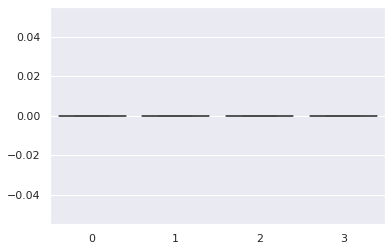

In [74]:
print(stcoef1, stcoef2)


## Seaborn plot 

import seaborn as sns
#.. what will the pcolormesh plot looks like?
#fig, ax  = plt.subplots(1, 2, figsize =(18.5, 6.5))
#..sns.boxplot(data=[d for d in stcoef1.T])
sns.boxplot(data=[f for f in stcoef1.T])
#sns.boxplot(data=[[stcoef1[:,0], stcoef1[:,1], stcoef1[:,2], stcoef1[:,3]], ['dLWP/d(SST)', 'dLWP/d(p-e)','dLWP/d(LTS)', 'dLWP/d(SUB)']])

plt.savefig('4lrm_sstltup.png')

/glade/work/chuyan/Research/Cloud_CCFs_RMs/plots_test1/BCC-ESM1_best(test3)fit_276.94_dats.npz
79
2 _
(110230,) (110230,)
/glade/work/chuyan/Research/Cloud_CCFs_RMs/plots_test1/CanESM5_best(test3)fit_272.9_dats.npz
78
2 _
(110230,) (110230,)
/glade/work/chuyan/Research/Cloud_CCFs_RMs/plots_test1/CESM2_best(test3)fit_279.73_dats.npz
76
2 _
(219000,) (219000,)
/glade/work/chuyan/Research/Cloud_CCFs_RMs/plots_test1/CESM2-FV2_best(test3)fit_0.0_dats.npz
80
0 _
(109500,) (109500,)
/glade/work/chuyan/Research/Cloud_CCFs_RMs/plots_test1/CESM2-WACCM_best(test3)fit_279.73_dats.npz
82
2 _
(109500,) (109500,)
/glade/work/chuyan/Research/Cloud_CCFs_RMs/plots_test1/CNRM-ESM2-1_best(test3)fit_275.75_dats.npz
82
2 _
(109500,) (109500,)
/glade/work/chuyan/Research/Cloud_CCFs_RMs/plots_test1/GISS-E2-1-G_best(test3)fit_0.0_dats.npz
82
0 _
(110230,) (110230,)
/glade/work/chuyan/Research/Cloud_CCFs_RMs/plots_test1/GISS-E2-1-H_best(test3)fit_0.0_dats.npz
82
0 _
(110230,) (110230,)
/glade/work/chuyan/Resear

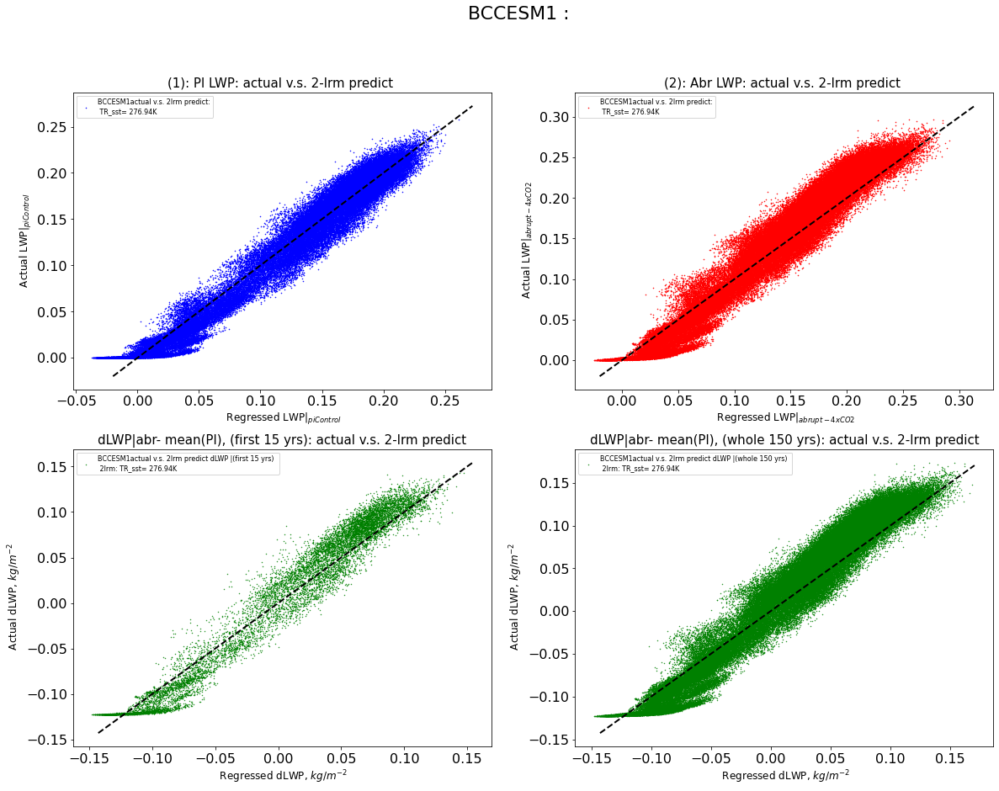

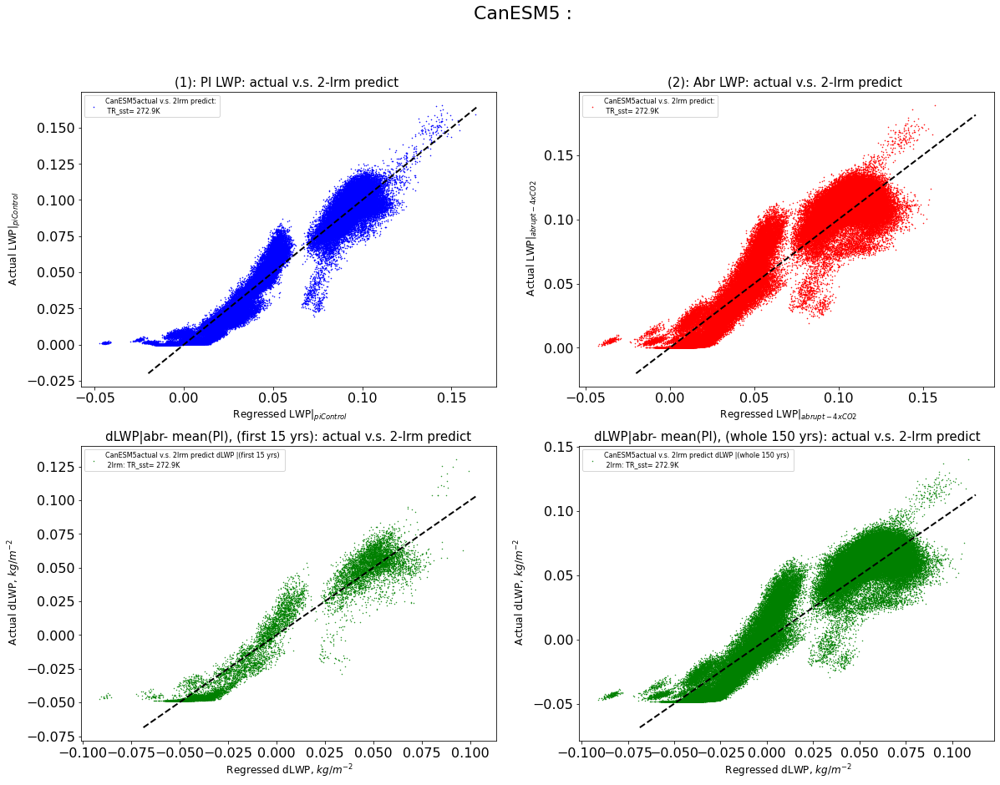

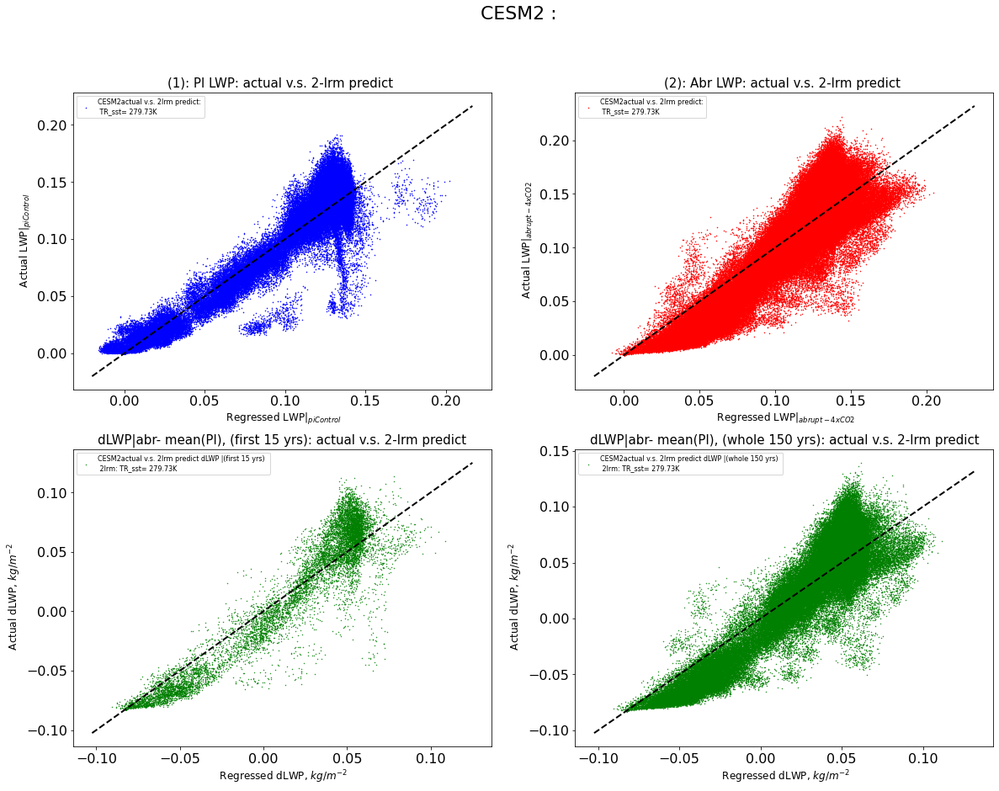

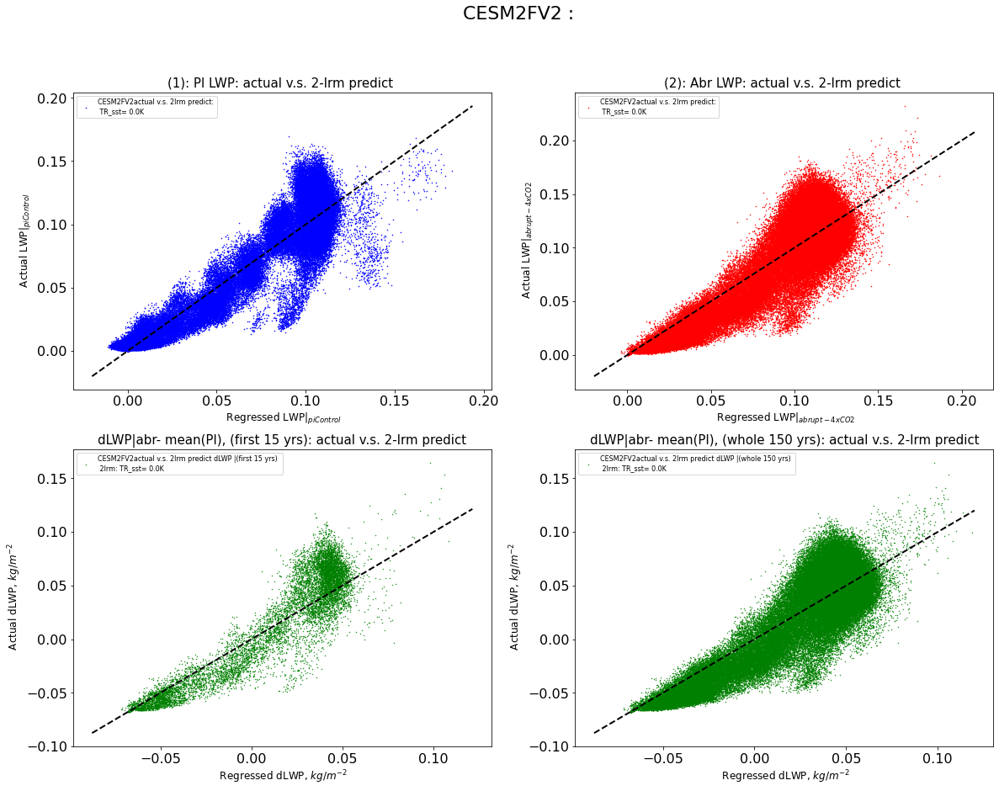

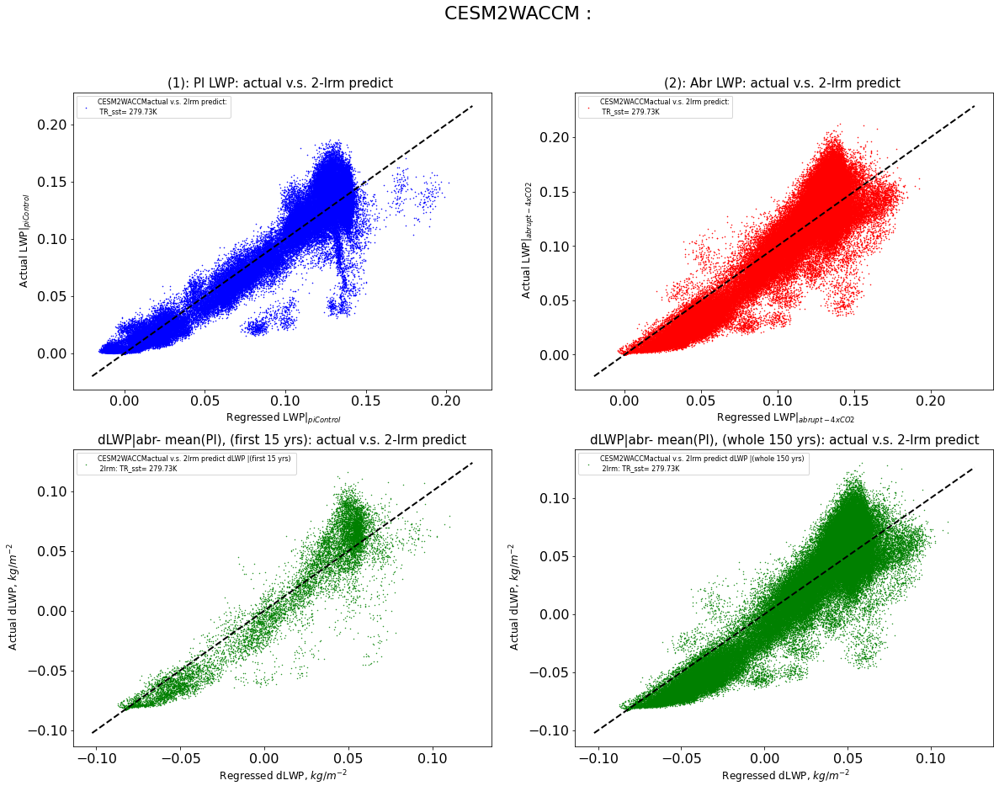

...

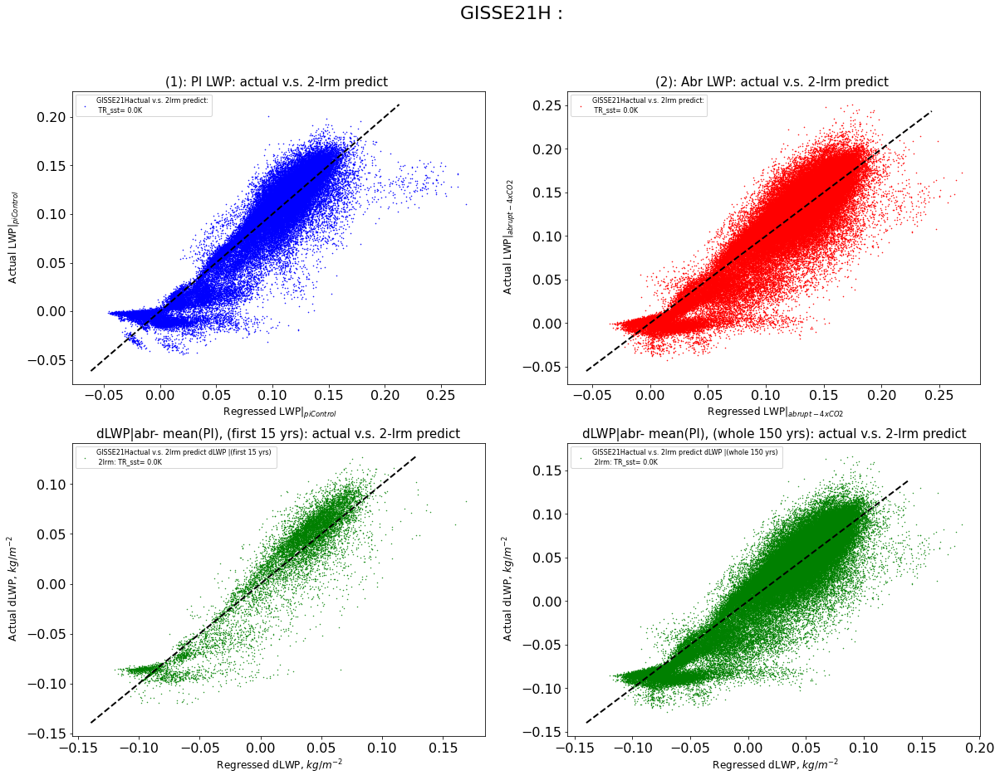

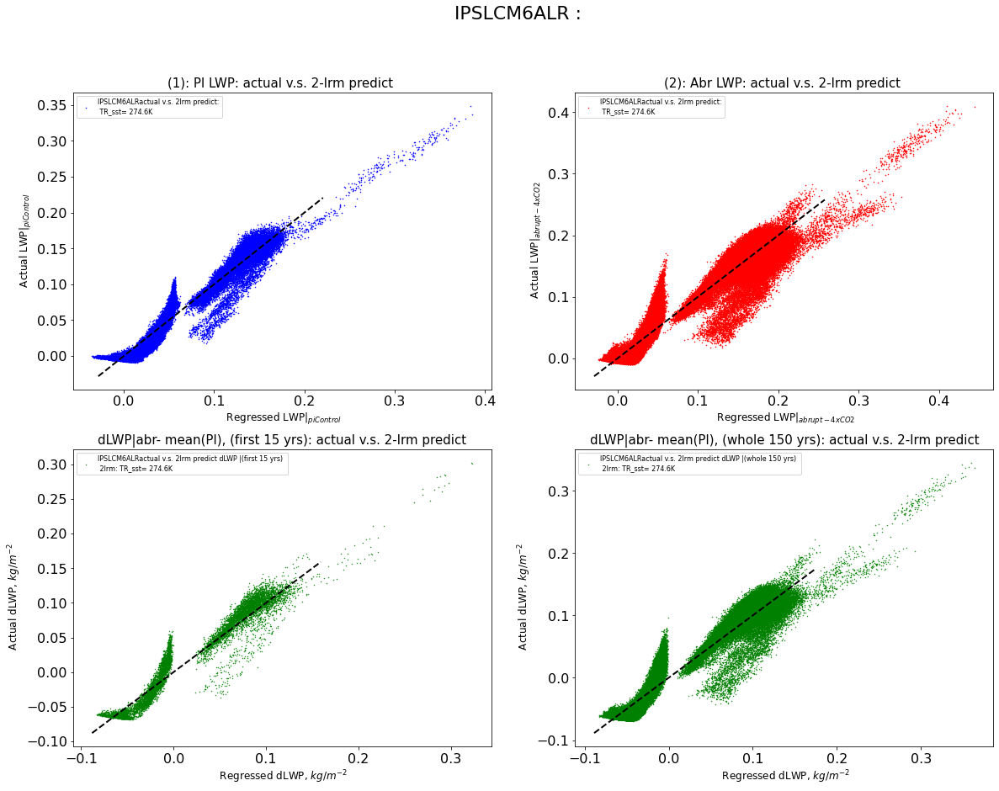

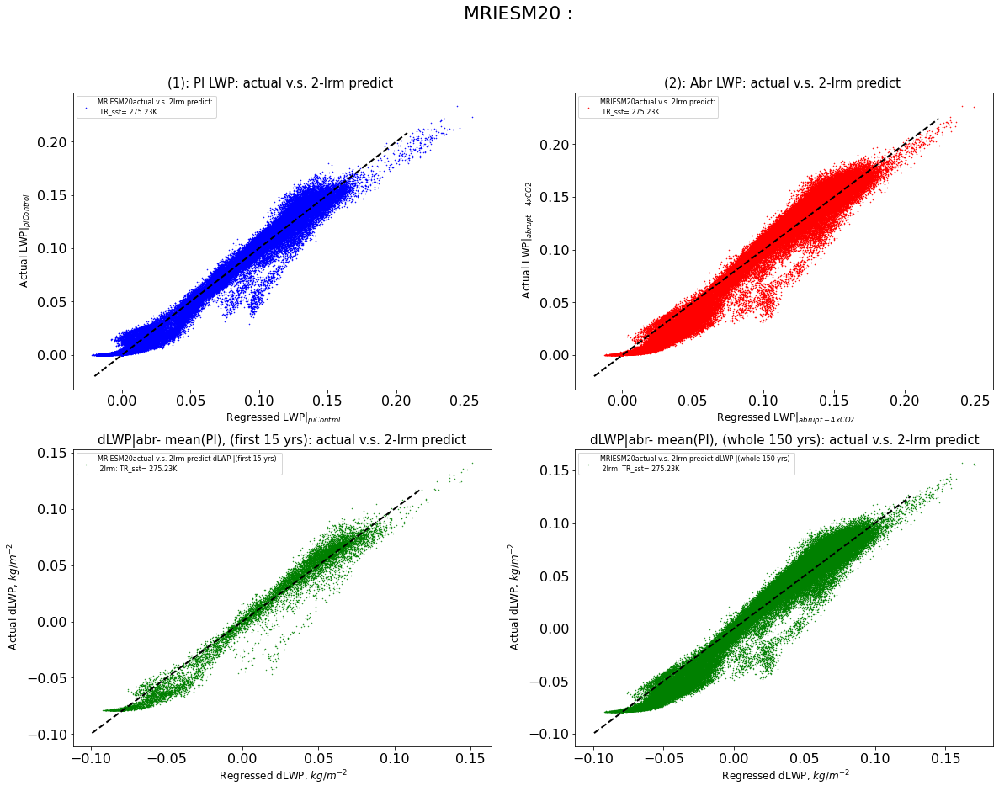

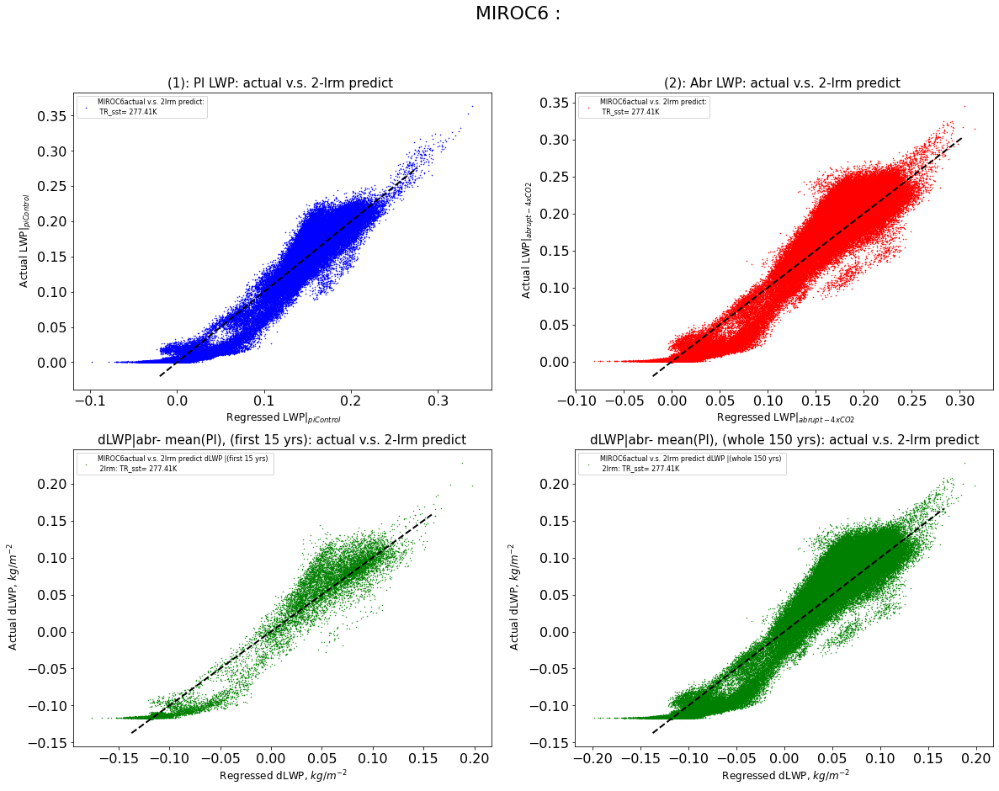

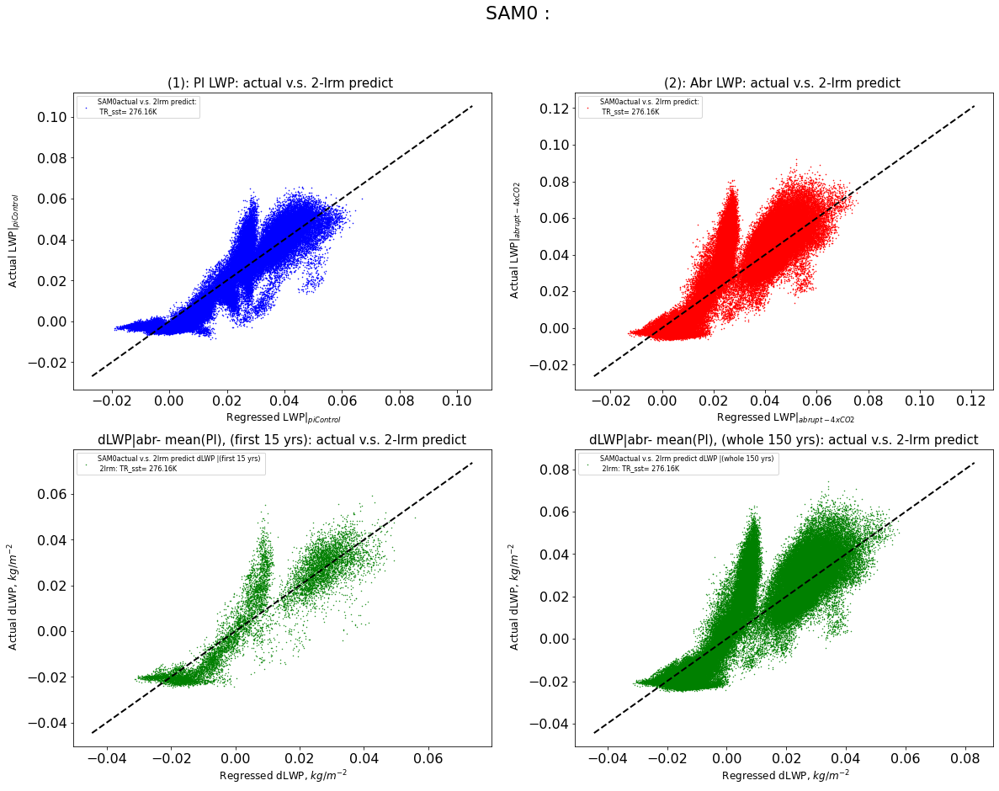

In [41]:
##  see Plots_ 2lrm model

# Abr yearly_binned_data scatter plot for actual LWP v.s. predicted 4-lrm LWP 

output_yrs = {}
#..dabrmpi_2lrm_actual_whole = {}
#..dabrmpi_2lrm_predict_whole ={}
#..dabrmpi_2lrm_actual_f50 =  {}
#..dabrmpi_2lrm_predict_f50 =  {}

for a in range(len(deck2)):
    
    #if deck_nas[a]=='CESM2'or deck_nas[a]=='CESM2FV2' or deck_nas[a]=='CESM2WACCM':   #..BCCESM1
    #if (deck_nas[a] == 'E3SM10') or (deck_nas[a]== 'BCCESM1') or (deck_nas[a] =='GFDLCM4'): 
    #..if deck_nas[a]=='BCCESM1':   # or deck_nas[a]=='CanESM5' or deck_nas[a]=='GISSE21H' or deck_nas[a]=='GISSE21G' or deck_nas[a]=='MIROC6':

    fig6, ax6 = plt.subplots(2, 2, figsize =(19.6, 14.3))   #(16.2, 9.3))

    parameters = {'axes.labelsize': 12, 'legend.fontsize': 13, 'axes.titlesize': 15, 
     'xtick.labelsize': 16, 'ytick.labelsize':16}

    plt.rcParams.update(parameters)

    my_colors= array([

        '#1f77b4', '#aec7e8', '#ff7f0e', '#ffbb78', '#2ca02c', '#98df8a',
        '#d62728', '#ff9896', '#9467bd', '#c5b0d5', '#8c564b', '#c49c94',
        '#e377c2', '#f7b6d2', '#7f7f7f', '#c7c7c7', '#bcbd22', '#dbdb8d',
        '#17becf', '#9edae5'])   #..plt.rcParams['axes.prop_cycle']()
    my_colorst= my_colors


    folder =  glob.glob(wpath1+deck2[a]['modn']+'_best(test3)fit_'+'*' +'_dats.npz')
    if len(folder[1]) < len(folder[0]):
        
        folder_2lrm =  folder[1]
    else:
        folder_2lrm =  folder[0]

    
    print(folder_2lrm)
    index_st_sst = folder_2lrm.index('fit') +4
    #print(index_st_sst)
    index_ed_sst = folder_2lrm.index('npz') -6
    #print(list(folder_2lrm)[index_st_sst], list(folder_2lrm)[index_ed_sst])
    
    PI_2lrm_actual  = array(output_2lrm_yr_bin_PI[deck_nas[a]]['LWP_yr_bin']).flatten()
    abr_2lrm_actual  = array(output_2lrm_yr_bin_abr[deck_nas[a]]['LWP_yr_bin']).flatten()

    PI_2lrm_predict  =  array(output_2lrm_yr_bin_LWPpredi_PI[deck_nas[a]]).flatten()
    abr_2lrm_predict  =  array(output_2lrm_yr_bin_LWPpredi_abr[deck_nas[a]]).flatten()

    print(abr_2lrm_predict.shape, abr_2lrm_actual.shape)


    dabrmpi_2lrm_actual_whole = (array(output_2lrm_yr_bin_abr[deck_nas[a]]['LWP_yr_bin'][0:150, :,:]) - nanmean(array(output_2lrm_yr_bin_PI[deck_nas[a]]['LWP_yr_bin']))).flatten()
    dabrmpi_2lrm_predict_whole = (array(output_2lrm_yr_bin_LWPpredi_abr[deck_nas[a]][0:150,:,:]) - nanmean(array(output_2lrm_yr_bin_LWPpredi_PI[deck_nas[a]]))).flatten()
    dabrmpi_2lrm_actual_f50 = (array(output_2lrm_yr_bin_abr[deck_nas[a]]['LWP_yr_bin'][0:15, :,:]) - nanmean(array(output_2lrm_yr_bin_PI[deck_nas[a]]['LWP_yr_bin']))).flatten()
    dabrmpi_2lrm_predict_f50 = (array(output_2lrm_yr_bin_LWPpredi_abr[deck_nas[a]][0:15,:,:]) - nanmean(array(output_2lrm_yr_bin_LWPpredi_PI[deck_nas[a]]))).flatten()


    output_yrs[deck_nas[a]]  = arange(shape_yr_modelPI[deck_nas[a]] + shape_yr_modelabr[deck_nas[a]])
    GMT = output_2lrm_GMT[deck_nas[a]][0:249]
    Yrs = output_yrs[deck_nas[a]][0:249]


    ax6[0,1].scatter(abr_2lrm_predict,  abr_2lrm_actual,  c  = 'r', s= 0.3,
                     #label= deck_nas[a] + f"actual v.s. 2lrm predict:\n TR_sst= {TR_sst}K, TR_sub = {TR_sub}Pa s-1")
                     label= deck_nas[a] + f"actual v.s. 2lrm predict:\n TR_sst= " +str(folder_2lrm)[index_st_sst:index_ed_sst]+ "K")
    ax6[0,0].scatter(PI_2lrm_predict,  PI_2lrm_actual,  c = 'b', s = 0.3,
                     #label= deck_nas[a] + f"actual v.s. 2lrm predict:\n TR_sst= {TR_sst}K, TR_sub = {TR_sub}Pa s-1")
                     label= deck_nas[a] + f"actual v.s. 2lrm predict:\n TR_sst= " +str(folder_2lrm)[index_st_sst:index_ed_sst]+ "K")
    
    ax6[1,1].scatter(dabrmpi_2lrm_predict_whole, dabrmpi_2lrm_actual_whole, c = 'g', s =0.2,
                     #label = deck_nas[a] + 'actual v.s. 2lrm predict dLWP |(whole 150 yrs)'+ f" \n 2lrm: TR_sst= {TR_sst}K")
                     label = deck_nas[a] + 'actual v.s. 2lrm predict dLWP |(whole 150 yrs)'+ f" \n 2lrm: TR_sst= " +str(folder_2lrm)[index_st_sst:index_ed_sst]+ "K")
    ax6[1,0].scatter(dabrmpi_2lrm_predict_f50, dabrmpi_2lrm_actual_f50,  c = 'g', s = 0.2,
                     #label =deck_nas[a] + 'actual v.s. 2lrm predict dLWP |(first 15 yrs)'+ f" \n 2lrm: TR_sst= {TR_sst}K, TR_sub = {TR_sub}Pa s-1")
                     label =deck_nas[a] + 'actual v.s. 2lrm predict dLWP |(first 15 yrs)'+ f" \n 2lrm: TR_sst= " +str(folder_2lrm)[index_st_sst:index_ed_sst]+ "K")

    
    # Reference line added:
    x1  = linspace(nanpercentile(abr_2lrm_actual, 0.01)-0.02, nanpercentile(abr_2lrm_actual, 99)+0.05,  50)
    y1  = x1
    x2  = linspace(nanpercentile(PI_2lrm_actual, 0.01)-0.02, nanpercentile(PI_2lrm_actual, 99)+0.05,  50)
    y2  = x2
    x3  = linspace(nanpercentile(dabrmpi_2lrm_actual_whole, 0.01)-0.02, nanpercentile(dabrmpi_2lrm_actual_whole, 99)+0.03, 50)
    y3  = x3
    x4  = linspace(nanpercentile(dabrmpi_2lrm_actual_f50, 0.01)-0.02, nanpercentile(dabrmpi_2lrm_actual_f50, 99)+0.03, 50)
    y4  = x4


    ax6[0,0].plot(x2, y2, color= 'k', linewidth =2, linestyle =  'dashed')
    ax6[0,1].plot(x1, y1, color= 'k', linewidth =2, linestyle =  'dashed')
    ax6[1,0].plot(x4, y4, color = 'k', linewidth =2, linestyle= 'dashed')
    ax6[1,1].plot(x3, y3, color = 'k', linewidth =2, linestyle = 'dashed')


    ax6[0,0].set_xlabel(" Regressed LWP$|_{piControl}$" )
    ax6[0,0].set_ylabel(" Actual LWP$|_{piControl}$" )

    ax6[0,1].set_xlabel(" Regressed LWP$|_{abrupt-4xCO2}$" )
    ax6[0,1].set_ylabel(" Actual LWP$|_{abrupt-4xCO2}$" )

    ax6[1,0].set_xlabel(" Regressed dLWP, "+r"$kg/ m^{-2}$")
    ax6[1,0].set_ylabel(" Actual dLWP, "+ r"$kg/ m^{-2}$")

    ax6[1,1].set_xlabel(" Regressed dLWP, "+r"$kg/ m^{-2}$")
    ax6[1,1].set_ylabel(" Actual dLWP, "+ r"$kg/ m^{-2}$")

    ax6[0,0].set_title("(1): PI LWP: actual v.s. 2-lrm predict ")
    ax6[0,1].set_title("(2): Abr LWP: actual v.s. 2-lrm predict ")
    ax6[1,0].set_title("dLWP|abr- mean(PI), (first 15 yrs): actual v.s. 2-lrm predict")
    ax6[1,1].set_title("dLWP|abr- mean(PI), (whole 150 yrs): actual v.s. 2-lrm predict")
    plt.suptitle(deck_nas[a] +" :", fontsize = 22)
    ax6[0,0].legend(loc='upper left', fontsize= 8)  #.loc='best', bbox_to_anchor=(-0.55, 0.38, 0.5, 0.63)
    ax6[0,1].legend(loc='upper left', fontsize= 8)
    ax6[1,0].legend(loc='upper left', fontsize= 8)
    ax6[1,1].legend(loc='upper left', fontsize= 8)
    
    
    #.. plot
    #..plt.savefig("Actual&RegressedValues_"+ deck_nas[a]+ "_2LRM_" +str(round(TR_sst))+'K', dpi= 100)
    plt.savefig("Actual&RegressedValues_"+ deck_nas[a]+ "_2LRM_" + 'Bestfit3', dpi= 100)
    

['/glade/work/chuyan/Research/Cloud_CCFs_RMs/plots_test1/BCC-ESM1_best(test3)fit_276.94K_ud-0.7_dats.npz']
9 K
(110230,) (110230,)
['/glade/work/chuyan/Research/Cloud_CCFs_RMs/plots_test1/CanESM5_best(test3)fit_272.9K_ud0.5_dats.npz']
9 K
(110230,) (110230,)
['/glade/work/chuyan/Research/Cloud_CCFs_RMs/plots_test1/CESM2_best(test3)fit_279.73K_ud-1.7_dats.npz']
7 K
(219000,) (219000,)
['/glade/work/chuyan/Research/Cloud_CCFs_RMs/plots_test1/CESM2-FV2_best(test3)fit_0.0K_ud-1.5_dats.npz']
_ K
(109500,) (109500,)
['/glade/work/chuyan/Research/Cloud_CCFs_RMs/plots_test1/CESM2-WACCM_best(test3)fit_279.73K_ud-1.7_dats.npz']
7 K
(109500,) (109500,)
['/glade/work/chuyan/Research/Cloud_CCFs_RMs/plots_test1/CNRM-ESM2-1_best(test3)fit_275.75K_ud0.0_dats.npz']
7 K
(109500,) (109500,)
['/glade/work/chuyan/Research/Cloud_CCFs_RMs/plots_test1/GISS-E2-1-G_best(test3)fit_0.0K_ud0.7_dats.npz']
_ K
(110230,) (110230,)
['/glade/work/chuyan/Research/Cloud_CCFs_RMs/plots_test1/GISS-E2-1-H_best(test3)fit_0.0

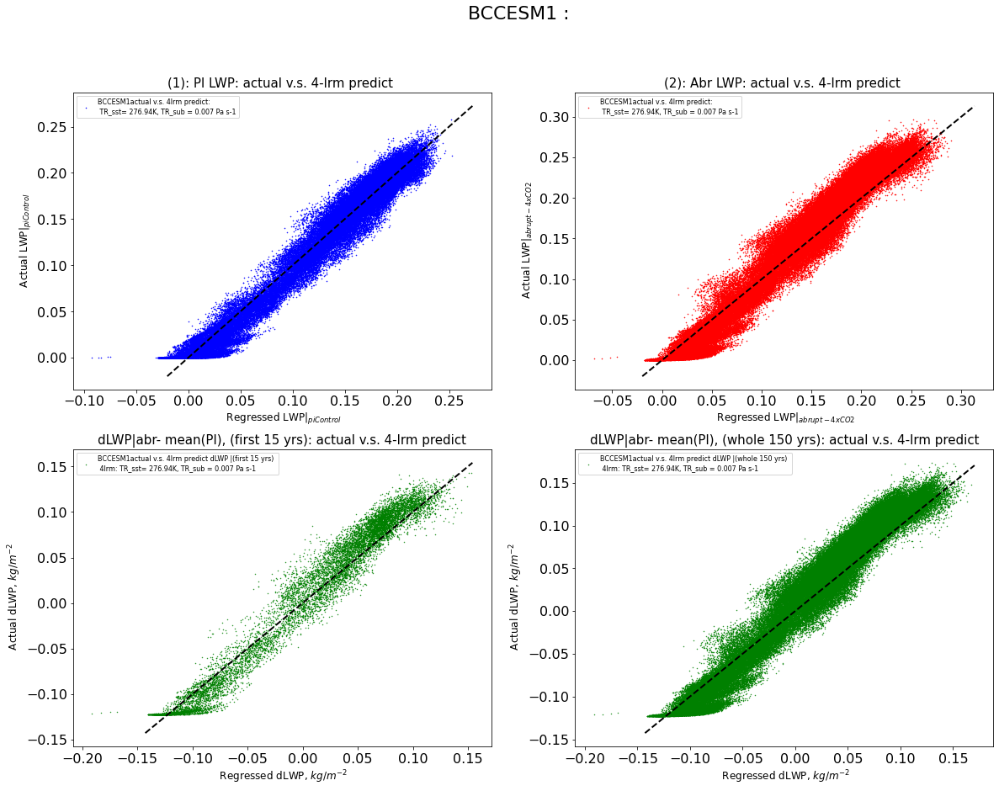

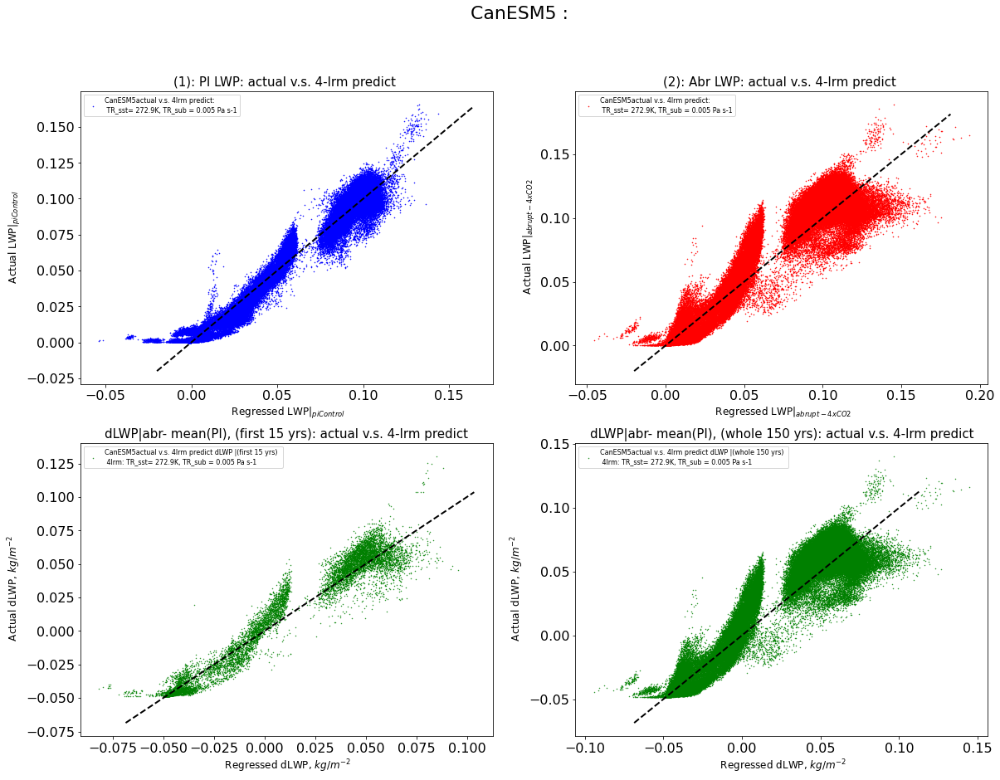

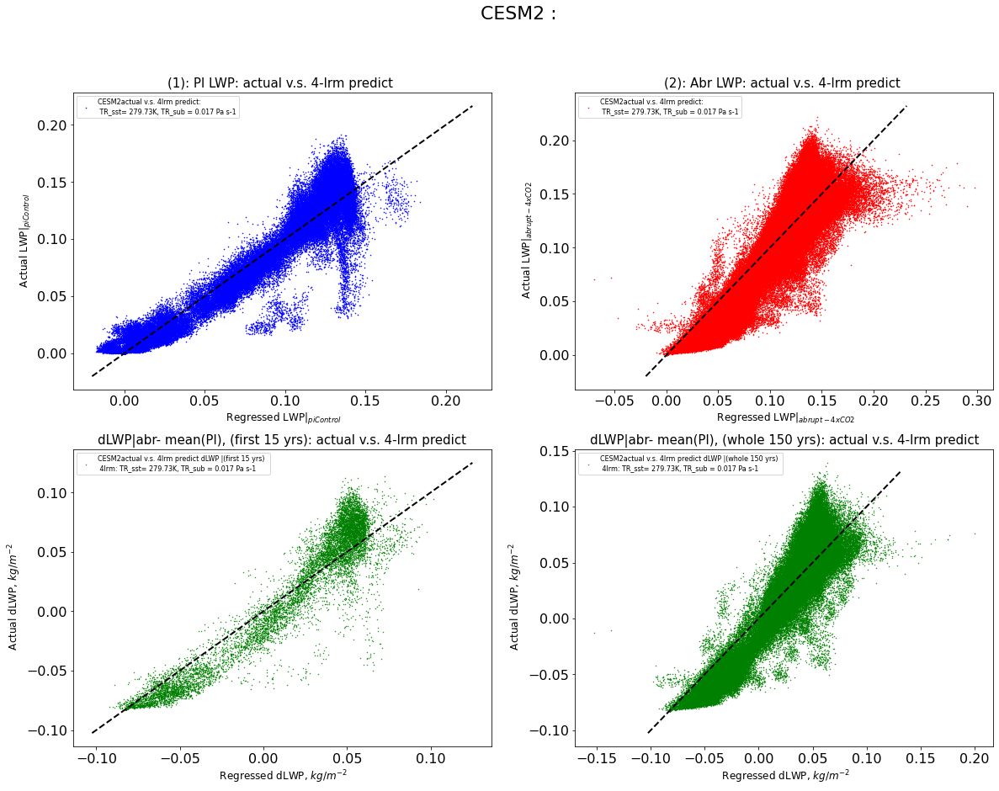

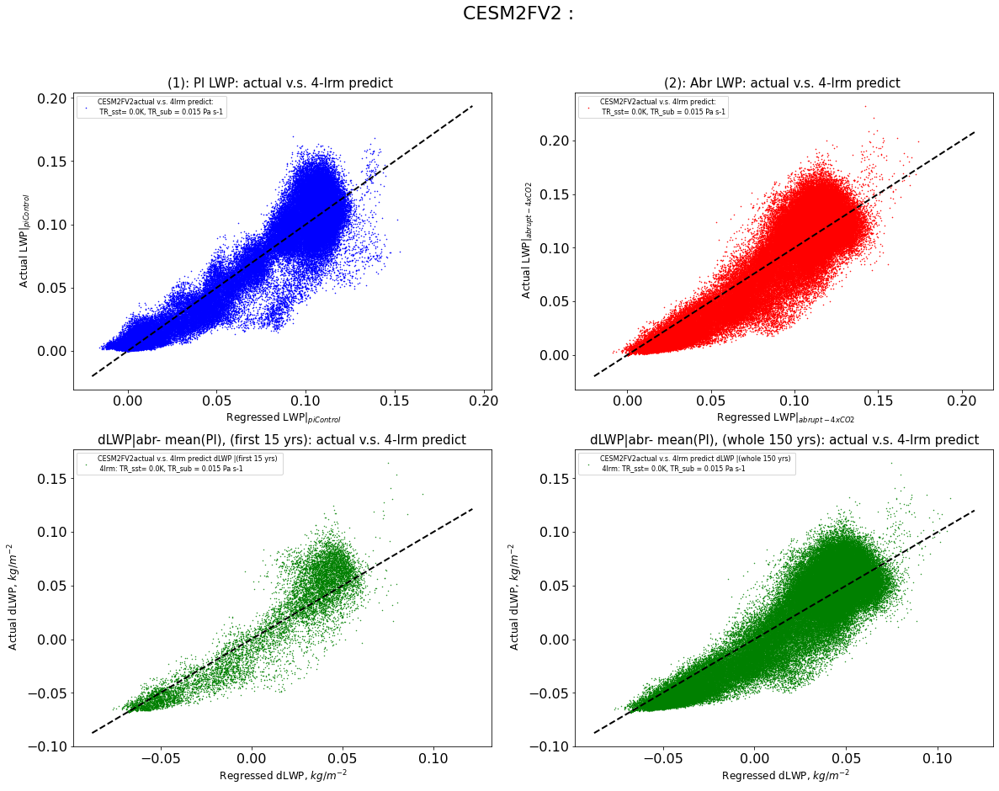

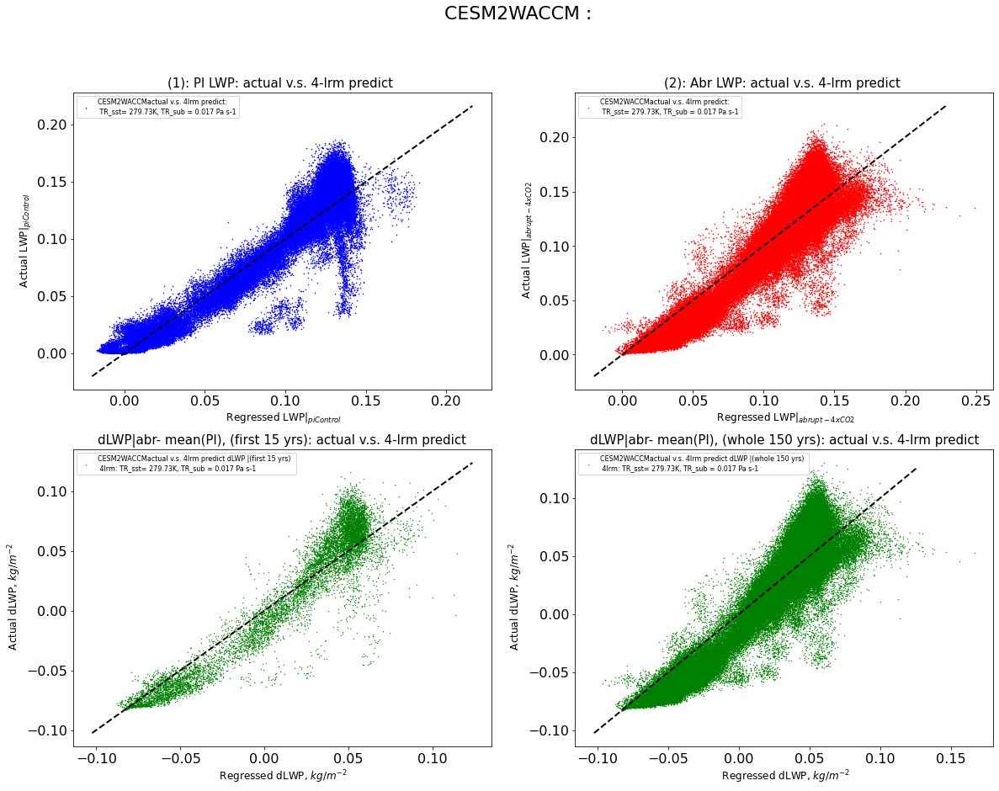

...

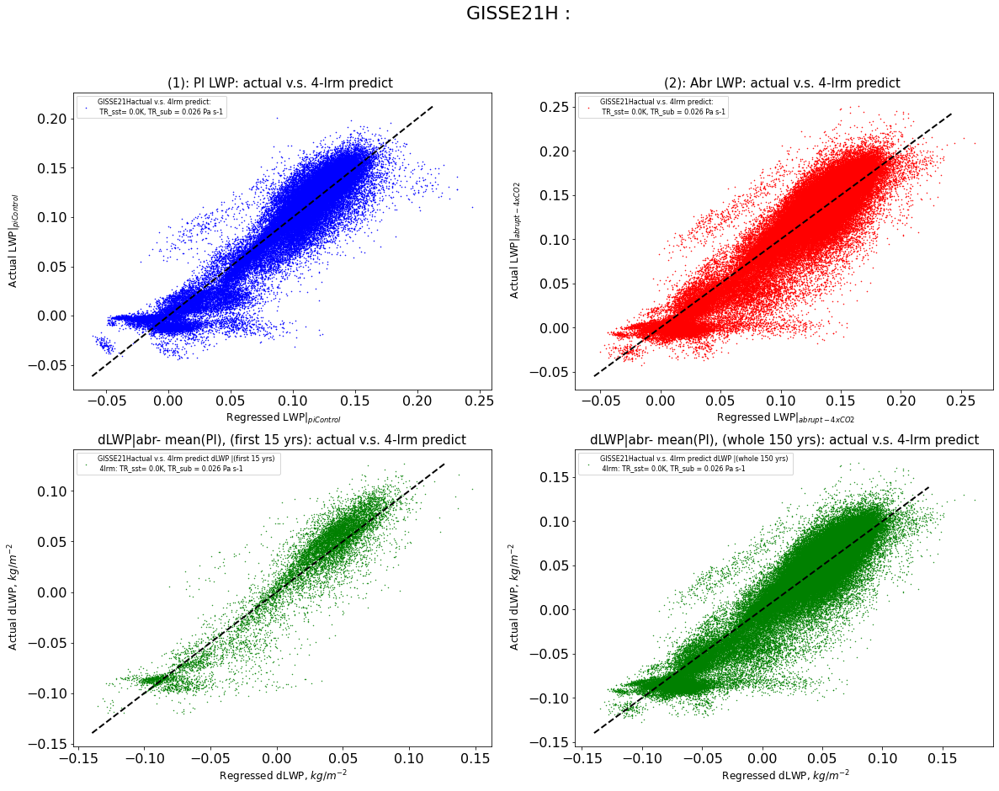

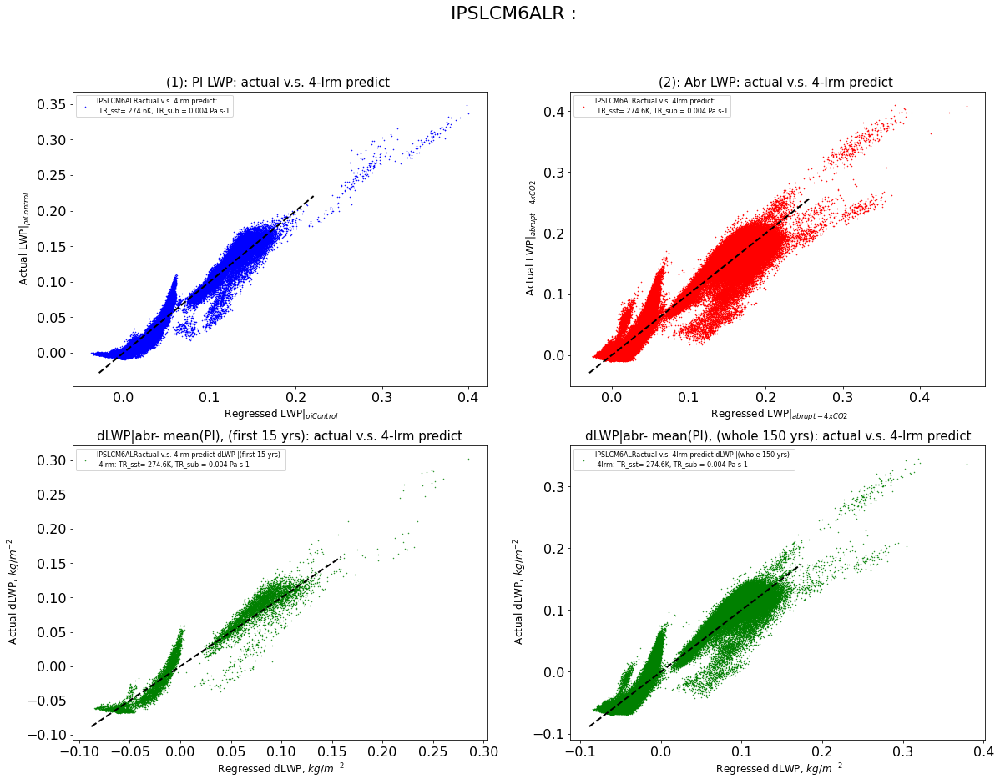

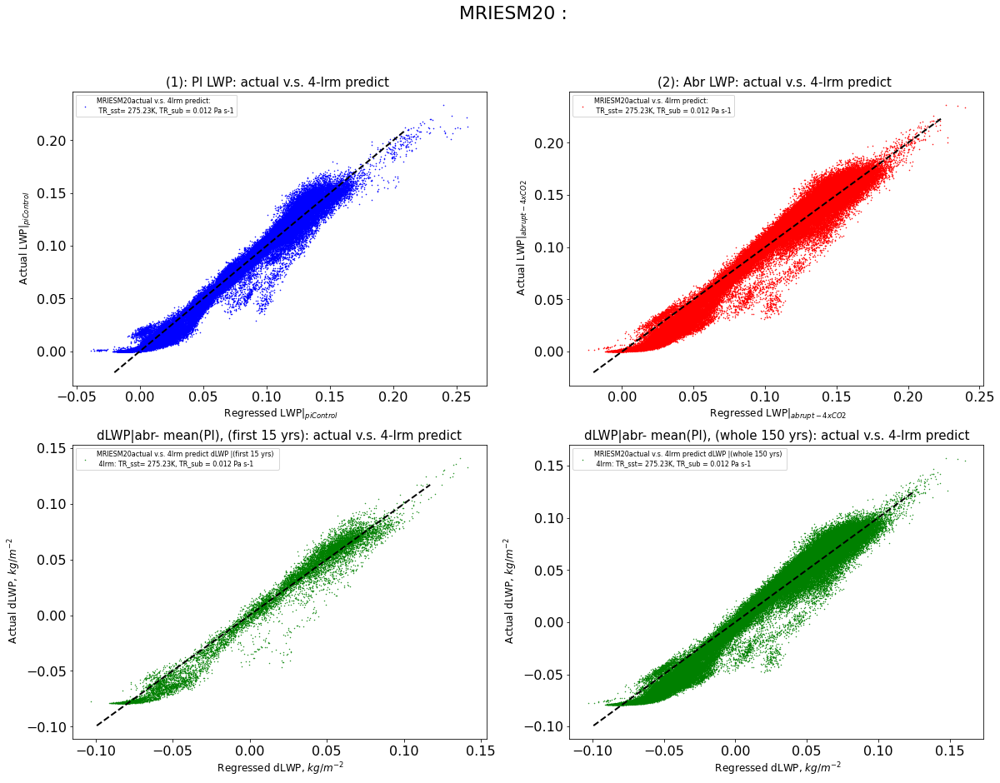

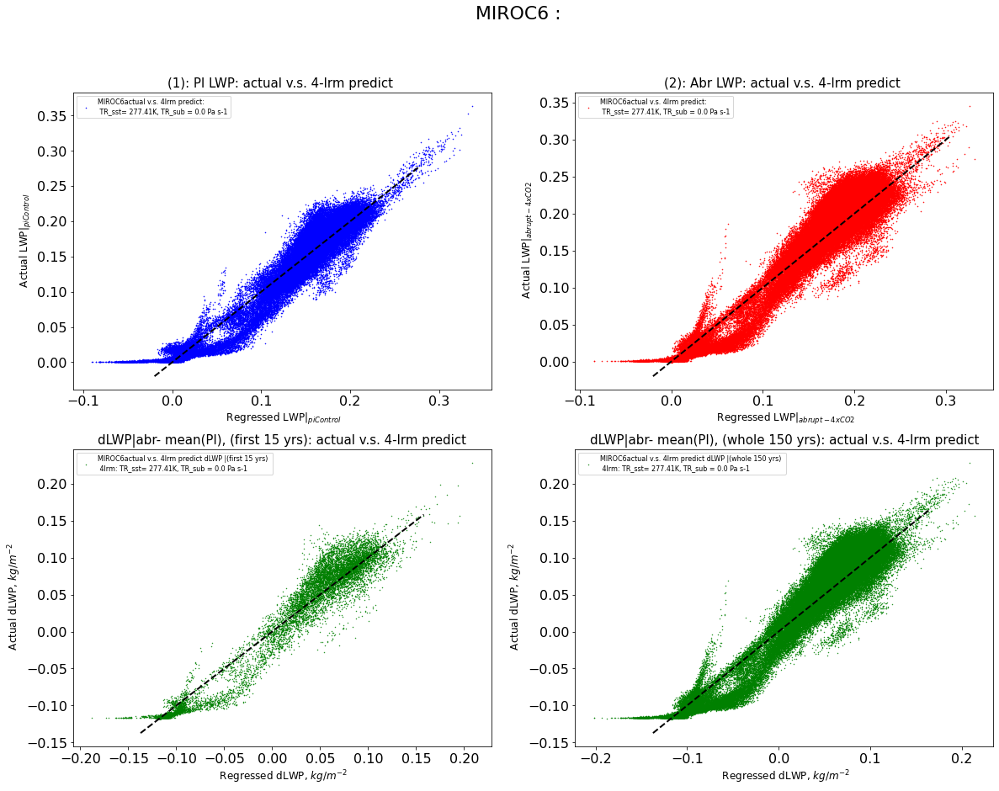

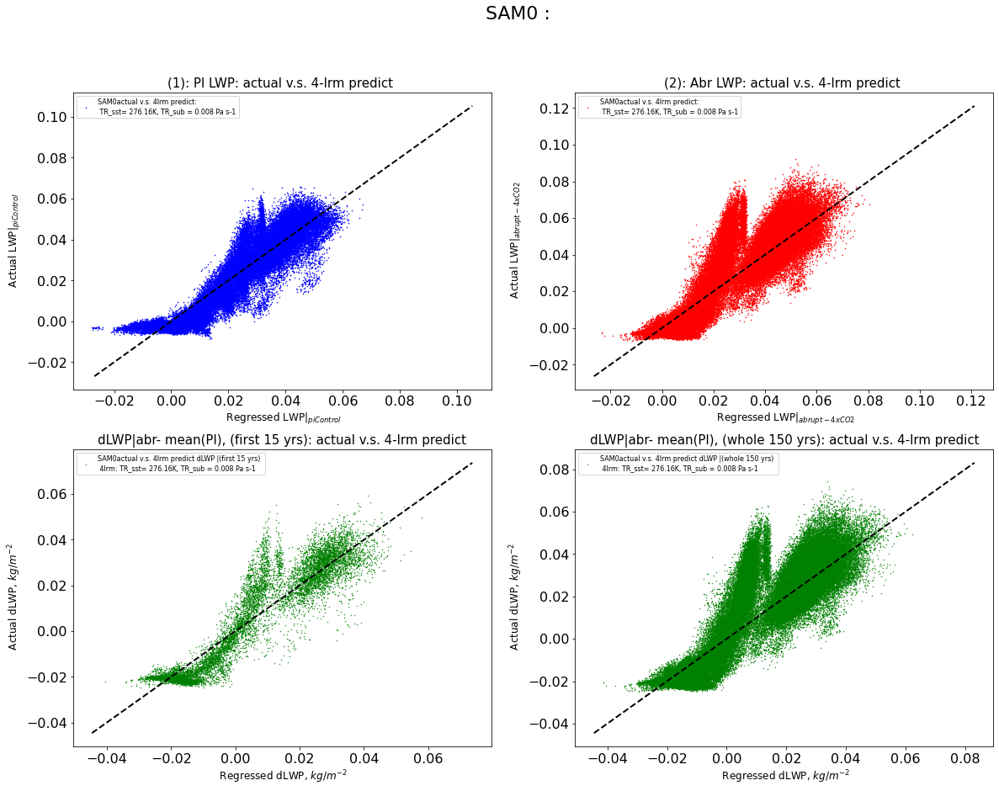

In [42]:
##  see 4-lrm Plots:

# Abr yearly_binned_data scatter plot for actual LWP v.s. predicted 4-lrm LWP 

output_yrs = {}
#..dabrmpi_4lrm_actual_whole = {}
#..dabrmpi_4lrm_predict_whole ={}
#..dabrmpi_4lrm_actual_f50 =  {}
#..dabrmpi_4lrm_predict_f50 =  {}

for a in range(len(deck2)):
    
    #if deck_nas[a]=='CESM2'or deck_nas[a]=='CESM2FV2' or deck_nas[a]=='CESM2WACCM':   #..BCCESM1
    #if (deck_nas[a] == 'E3SM10') or (deck_nas[a]== 'BCCESM1') or (deck_nas[a] =='GFDLCM4'): 
    #..if deck_nas[a]=='BCCESM1':   # or deck_nas[a]=='CanESM5' or deck_nas[a]=='GISSE21H' or deck_nas[a]=='GISSE21G' or deck_nas[a]=='MIROC6':

    ##Best fitted data
    folder_4lrm =  glob.glob(wpath1+deck2[a]['modn']+'_best(test3)fit_'+'*K'+'_ud'+'*'+'_dats.npz')
    print(folder_4lrm)
    index_st_sst = folder_4lrm[0].index('fit') +4

    index_ed_sst = folder_4lrm[0].index('K')
    print(list(folder_4lrm[0])[index_st_sst +4], list(folder_4lrm[0])[index_ed_sst])
    index_st_sub  = folder_4lrm[0].index('_ud') +4
    index_ed_sub  = folder_4lrm[0].index('_dats')

    
    fig6, ax6 = plt.subplots(2, 2, figsize =(19.6, 14.3))   #(16.2, 9.3))

    parameters = {'axes.labelsize': 12, 'legend.fontsize': 13, 'axes.titlesize': 15,  
     'xtick.labelsize': 16, 'ytick.labelsize':16}

    plt.rcParams.update(parameters)


    my_colors= array([

        '#1f77b4', '#aec7e8', '#ff7f0e', '#ffbb78', '#2ca02c', '#98df8a',
        '#d62728', '#ff9896', '#9467bd', '#c5b0d5', '#8c564b', '#c49c94',
        '#e377c2', '#f7b6d2', '#7f7f7f', '#c7c7c7', '#bcbd22', '#dbdb8d',
        '#17becf', '#9edae5'])   #..plt.rcParams['axes.prop_cycle']()
    my_colorst= my_colors


    PI_4lrm_actual  = array(output_4lrm_yr_bin_PI[deck_nas[a]]['LWP_yr_bin']).flatten()
    abr_4lrm_actual  = array(output_4lrm_yr_bin_abr[deck_nas[a]]['LWP_yr_bin']).flatten()

    PI_4lrm_predict  =  array(output_4lrm_yr_bin_LWPpredi_PI[deck_nas[a]]).flatten()
    abr_4lrm_predict  =  array(output_4lrm_yr_bin_LWPpredi_abr[deck_nas[a]]).flatten()

    print(abr_4lrm_predict.shape, abr_4lrm_actual.shape)


    dabrmpi_4lrm_actual_whole = (array(output_4lrm_yr_bin_abr[deck_nas[a]]['LWP_yr_bin'][0:150, :,:]) - nanmean(array(output_4lrm_yr_bin_PI[deck_nas[a]]['LWP_yr_bin']))).flatten()
    dabrmpi_4lrm_predict_whole = (array(output_4lrm_yr_bin_LWPpredi_abr[deck_nas[a]][0:150,:,:]) - nanmean(array(output_4lrm_yr_bin_LWPpredi_PI[deck_nas[a]]))).flatten()
    dabrmpi_4lrm_actual_f15 = (array(output_4lrm_yr_bin_abr[deck_nas[a]]['LWP_yr_bin'][0:15, :,:]) - nanmean(array(output_4lrm_yr_bin_PI[deck_nas[a]]['LWP_yr_bin']))).flatten()
    dabrmpi_4lrm_predict_f15 = (array(output_4lrm_yr_bin_LWPpredi_abr[deck_nas[a]][0:15,:,:]) - nanmean(array(output_4lrm_yr_bin_LWPpredi_PI[deck_nas[a]]))).flatten()


    output_yrs[deck_nas[a]]  = arange(shape_yr_modelPI[deck_nas[a]] + shape_yr_modelabr[deck_nas[a]])
    GMT = output_4lrm_GMT[deck_nas[a]][0:249]
    Yrs = output_yrs[deck_nas[a]][0:249]


    ax6[0,1].scatter(abr_4lrm_predict,  abr_4lrm_actual,  c  = 'r', s = 0.3, 
                     #label= deck_nas[a] + f"actual v.s. 4lrm predict:\n TR_sst= {TR_sst}K, TR_sub = {TR_sub}Pa s-1")
                     label= deck_nas[a] + "actual v.s. 4lrm predict:\n TR_sst= " +str(folder_4lrm[0])[index_st_sst:index_ed_sst]+ "K, TR_sub = "+ str(round(float(str(folder_4lrm[0])[index_st_sub:index_ed_sub]) *0.01, 5))+" Pa s-1")
    ax6[0,0].scatter(PI_4lrm_predict,  PI_4lrm_actual,  c = 'b', s =0.3,
                     #.label= deck_nas[a] + f"actual v.s. 4lrm predict:\n TR_sst= {TR_sst}K, TR_sub = {TR_sub}Pa s-1")
                     label= deck_nas[a] + "actual v.s. 4lrm predict:\n TR_sst= " +str(folder_4lrm[0])[index_st_sst:index_ed_sst]+ "K, TR_sub = "+ str(round(float(str(folder_4lrm[0])[index_st_sub:index_ed_sub]) *0.01, 5))+" Pa s-1")
    ax6[1,1].scatter(dabrmpi_4lrm_predict_whole, dabrmpi_4lrm_actual_whole, c = 'g', s= 0.2,
                     #label =deck_nas[a] + 'actual v.s. 4lrm predict dLWP |(whole 150 yrs)'+ f" \n 4lrm: TR_sst= {TR_sst}K, TR_sub = {TR_sub}Pa s-1")
                     label =deck_nas[a] + 'actual v.s. 4lrm predict dLWP |(whole 150 yrs)'+ " \n 4lrm: TR_sst= " +str(folder_4lrm[0])[index_st_sst:index_ed_sst]+ "K, TR_sub = "+ str(round(float(str(folder_4lrm[0][index_st_sub:index_ed_sub])) *0.01, 5))+" Pa s-1")
    ax6[1,0].scatter(dabrmpi_4lrm_predict_f15, dabrmpi_4lrm_actual_f15,  c = 'g', s= 0.2, 
                     #label =deck_nas[a] + 'actual v.s. 4lrm predict dLWP |(first 15 yrs)'+ f" \n 4lrm: TR_sst= {TR_sst}K, TR_sub = {TR_sub}Pa s-1")
                     label =deck_nas[a] + 'actual v.s. 4lrm predict dLWP |(first 15 yrs)'+ " \n 4lrm: TR_sst= " +str(folder_4lrm[0])[index_st_sst:index_ed_sst]+ "K, TR_sub = "+ str(round(float(str(folder_4lrm[0][index_st_sub:index_ed_sub])) *0.01, 5))+" Pa s-1")


    # Reference line added:
    x1  = linspace(nanpercentile(abr_4lrm_actual, 0.01)-0.02, nanpercentile(abr_4lrm_actual, 99)+0.05,  50)
    y1  = x1
    x2  = linspace(nanpercentile(PI_4lrm_actual, 0.01)-0.02, nanpercentile(PI_4lrm_actual, 99)+0.05,  50)
    y2  = x2
    x3  = linspace(nanpercentile(dabrmpi_4lrm_actual_whole, 0.01)-0.02, nanpercentile(dabrmpi_4lrm_actual_whole, 99)+0.03, 50)
    y3  = x3
    x4  = linspace(nanpercentile(dabrmpi_4lrm_actual_f15, 0.01)-0.02, nanpercentile(dabrmpi_4lrm_actual_f15, 99)+0.03, 50)
    y4  = x4


    ax6[0,0].plot(x2, y2, color= 'k', linewidth =2, linestyle =  'dashed')
    ax6[0,1].plot(x1, y1, color= 'k', linewidth =2, linestyle =  'dashed')
    ax6[1,0].plot(x4, y4, color = 'k', linewidth =2, linestyle= 'dashed')
    ax6[1,1].plot(x3, y3, color = 'k', linewidth =2, linestyle = 'dashed')


    ax6[0,0].set_xlabel(" Regressed LWP$|_{piControl}$" )
    ax6[0,0].set_ylabel(" Actual LWP$|_{piControl}$" )

    ax6[0,1].set_xlabel(" Regressed LWP$|_{abrupt-4xCO2}$" )
    ax6[0,1].set_ylabel(" Actual LWP$|_{abrupt-4xCO2}$" )

    ax6[1,0].set_xlabel(" Regressed dLWP, "+r"$kg/ m^{-2}$")
    ax6[1,0].set_ylabel(" Actual dLWP, "+ r"$kg/ m^{-2}$")

    ax6[1,1].set_xlabel(" Regressed dLWP, "+r"$kg/ m^{-2}$")
    ax6[1,1].set_ylabel(" Actual dLWP, "+ r"$kg/ m^{-2}$")

    ax6[0,0].set_title("(1): PI LWP: actual v.s. 4-lrm predict ")
    ax6[0,1].set_title("(2): Abr LWP: actual v.s. 4-lrm predict ")
    ax6[1,0].set_title("dLWP|abr- mean(PI), (first 15 yrs): actual v.s. 4-lrm predict")
    ax6[1,1].set_title("dLWP|abr- mean(PI), (whole 150 yrs): actual v.s. 4-lrm predict")
    plt.suptitle(deck_nas[a] +" :", fontsize = 22)
    #..plt.legend(loc='upper left', fontsize= 8)  #.loc='best', bbox_to_anchor=(-0.55, 0.38, 0.5, 0.63)
    ax6[0,0].legend(loc='upper left', fontsize= 8)  #.loc='best', bbox_to_anchor=(-0.55, 0.38, 0.5, 0.63)
    ax6[0,1].legend(loc='upper left', fontsize= 8)
    ax6[1,0].legend(loc='upper left', fontsize= 8)
    ax6[1,1].legend(loc='upper left', fontsize= 8)
    
    
    #.. plot
    # plt.savefig("Actual&RegressedValues_"+ deck_nas[a]+ "_4LRM_" +str(round(TR_sst))+'K_'+str(round(TR_sub*1000))+ 'ud', dpi= 100)
    plt.savefig("Actual&RegressedValues_"+ deck_nas[a]+ "_4LRM_" + 'Bestfit3', dpi= 100)
    

(110230,) (110230,)
(110230,) (110230,)
(110230,) (110230,)
(109500,) (109500,)
(109500,) (109500,)
(109500,) (109500,)
(109500,) (109500,)
(109500,) (109500,)
(109500,) (109500,)
(109500,) (109500,)
(109500,) (109500,)
(109500,) (109500,)
(110230,) (110230,)
(109500,) (109500,)
(110230,) (110230,)
(109500,) (109500,)
(219000,) (219000,)
(109500,) (109500,)
(110230,) (110230,)
(109500,) (109500,)
(109500,) (109500,)
(109500,) (109500,)
(109500,) (109500,)
(109500,) (109500,)


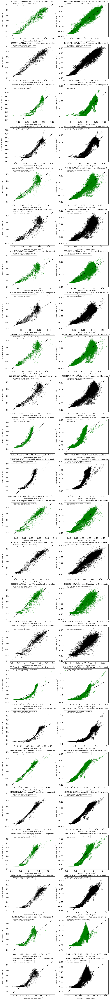

In [56]:
##  see Plots_ 2lrm+ 4lrm
# subplots into 1
# Abr yearly_binned_data scatter plot for actual LWP v.s. predicted 4-lrm LWP

output_yrs = {}
#..dabrmpi_4lrm_actual_whole = {}
#..dabrmpi_4lrm_predict_whole ={}
#..dabrmpi_4lrm_actual_f50 =  {}
#..dabrmpi_4lrm_predict_f50 =  {}


fig6, ax6 = plt.subplots(2*len(deck2), 2, figsize =(16.6, len(deck2)*14.3))   #(16.2, 9.3))

parameters = {'axes.labelsize': 12, 'legend.fontsize': 13, 'axes.titlesize': 15, 
 'xtick.labelsize': 16, 'ytick.labelsize':16}

plt.rcParams.update(parameters)


my_colors= array([
    '#1f77b4', '#aec7e8', '#ff7f0e', '#ffbb78', '#2ca02c', '#98df8a',
    '#d62728', '#ff9896', '#9467bd', '#c5b0d5', '#8c564b', '#c49c94',
    '#e377c2', '#f7b6d2', '#7f7f7f', '#c7c7c7', '#bcbd22', '#dbdb8d',
    '#17becf', '#9edae5'])   #..plt.rcParams['axes.prop_cycle']()
my_colorst= my_colors



for a in range(len(deck2)):
    
    #if deck_nas[a]=='CESM2'or deck_nas[a]=='CESM2FV2' or deck_nas[a]=='CESM2WACCM':   #..BCCESM1
    #if (deck_nas[a] == 'E3SM10') or (deck_nas[a]== 'BCCESM1') or (deck_nas[a] =='GFDLCM4'): 
    #..if deck_nas[a]=='BCCESM1':   # or deck_nas[a]=='CanESM5' or deck_nas[a]=='GISSE21H' or deck_nas[a]=='GISSE21G' or deck_nas[a]=='MIROC6':
    
    ##  reading data
    PI_2lrm_actual  = array(output_2lrm_yr_bin_PI[deck_nas[a]]['LWP_yr_bin']).flatten()
    abr_2lrm_actual  = array(output_2lrm_yr_bin_abr[deck_nas[a]]['LWP_yr_bin']).flatten()
    PI_2lrm_predict  =  array(output_2lrm_yr_bin_LWPpredi_PI[deck_nas[a]]).flatten()
    abr_2lrm_predict  =  array(output_2lrm_yr_bin_LWPpredi_abr[deck_nas[a]]).flatten()
    print(abr_2lrm_predict.shape, abr_2lrm_actual.shape)

    
    PI_4lrm_actual  = array(output_4lrm_yr_bin_PI[deck_nas[a]]['LWP_yr_bin']).flatten()
    abr_4lrm_actual  = array(output_4lrm_yr_bin_abr[deck_nas[a]]['LWP_yr_bin']).flatten()
    PI_4lrm_predict  =  array(output_4lrm_yr_bin_LWPpredi_PI[deck_nas[a]]).flatten()
    abr_4lrm_predict  =  array(output_4lrm_yr_bin_LWPpredi_abr[deck_nas[a]]).flatten()

    print(abr_4lrm_predict.shape, abr_4lrm_actual.shape)


    ##  calculating data
    dabrmpi_2lrm_actual_whole = (array(output_2lrm_yr_bin_abr[deck_nas[a]]['LWP_yr_bin'][0:150, :,:]) - nanmean(array(output_2lrm_yr_bin_PI[deck_nas[a]]['LWP_yr_bin']))).flatten()
    dabrmpi_2lrm_predict_whole = (array(output_2lrm_yr_bin_LWPpredi_abr[deck_nas[a]][0:150,:,:]) - nanmean(array(output_2lrm_yr_bin_LWPpredi_PI[deck_nas[a]]))).flatten()
    dabrmpi_2lrm_actual_f15 = (array(output_2lrm_yr_bin_abr[deck_nas[a]]['LWP_yr_bin'][0:15, :,:]) - nanmean(array(output_2lrm_yr_bin_PI[deck_nas[a]]['LWP_yr_bin']))).flatten()
    dabrmpi_2lrm_predict_f15 = (array(output_2lrm_yr_bin_LWPpredi_abr[deck_nas[a]][0:15 ,:,:]) - nanmean(array(output_2lrm_yr_bin_LWPpredi_PI[deck_nas[a]]))).flatten()
    
    
    dabrmpi_4lrm_actual_whole = (array(output_4lrm_yr_bin_abr[deck_nas[a]]['LWP_yr_bin'][0:150, :,:]) - nanmean(array(output_4lrm_yr_bin_PI[deck_nas[a]]['LWP_yr_bin']))).flatten()
    dabrmpi_4lrm_predict_whole = (array(output_4lrm_yr_bin_LWPpredi_abr[deck_nas[a]][0:150,:,:]) - nanmean(array(output_4lrm_yr_bin_LWPpredi_PI[deck_nas[a]]))).flatten()
    dabrmpi_4lrm_actual_f15 = (array(output_4lrm_yr_bin_abr[deck_nas[a]]['LWP_yr_bin'][0:15, :,:]) - nanmean(array(output_4lrm_yr_bin_PI[deck_nas[a]]['LWP_yr_bin']))).flatten()
    dabrmpi_4lrm_predict_f15 = (array(output_4lrm_yr_bin_LWPpredi_abr[deck_nas[a]][0:15,:,:]) - nanmean(array(output_4lrm_yr_bin_LWPpredi_PI[deck_nas[a]]))).flatten()

    '''
    output_yrs[deck_nas[a]]  = arange(shape_yr_modelPI[deck_nas[a]] + shape_yr_modelabr[deck_nas[a]])
    GMT = output_4lrm_GMT[deck_nas[a]][0:249]
    Yrs = output_yrs[deck_nas[a]][0:249]
    '''
    output_yrs[deck_nas[a]]  = arange(shape_yr_modelPI[deck_nas[a]] + shape_yr_modelabr[deck_nas[a]])
    GMT = output_2lrm_GMT[deck_nas[a]][0:249]
    Yrs = output_yrs[deck_nas[a]][0:249]


    #ax6[0,1].scatter(abr_2lrm_predict,  abr_2lrm_actual,  c  = 'r', label= deck_nas[a] + f"abr actualv.s.2lrm predict:\n TR_sst= {TR_sst}K, TR_sub = {TR_sub}Pa s-1")
    #ax6[0,0].scatter(PI_2lrm_predict,  PI_2lrm_actual,  c = 'b', label= deck_nas[a] + f"PI actualv.s.2lrm predict:\n TR_sst= {TR_sst}K, TR_sub = {TR_sub}Pa s-1")
    ax6[2*a,1].scatter(dabrmpi_2lrm_predict_whole, dabrmpi_2lrm_actual_whole, c = 'g', s = 0.2,
                     label = deck_nas[a] + 'actual v.s. 2lrm predict dLWP |(whole 150 yrs)'+ f" \n 2lrm: TR_sst= {TR_sst}K")
                     #label = deck_nas[a] + 'actual v.s. 2lrm predict dLWP |(whole 150 yrs)'+ f" \n 2lrm: TR_sst= " +str(folder_2lrm)[index_st_sst:index_ed_sst]+ "K")
    ax6[2*a,0].scatter(dabrmpi_2lrm_predict_f15, dabrmpi_2lrm_actual_f15,  c = 'g', s = 0.2,
                     label =deck_nas[a] + 'actual v.s. 2lrm predict dLWP |(first 15 yrs)'+ f" \n 2lrm: TR_sst= {TR_sst}K, TR_sub = {TR_sub}Pa s-1")
                     #label =deck_nas[a] + 'actual v.s. 2lrm predict dLWP |(first 15 yrs)'+ f" \n 2lrm: TR_sst= " +str(folder_2lrm)[index_st_sst:index_ed_sst]+ "K")
    
    ax6[2*a+1,1].scatter(dabrmpi_4lrm_predict_whole, dabrmpi_4lrm_actual_whole, c = 'k', s= 0.2,
                     label =deck_nas[a] + 'actual v.s. 4lrm predict dLWP |(whole 150 yrs)'+ f" \n 4lrm: TR_sst= {TR_sst}K, TR_sub = {TR_sub}Pa s-1")
                     #label =deck_nas[a] + 'actual v.s. 4lrm predict dLWP |(whole 150 yrs)'+ " \n 4lrm: TR_sst= " +str(folder_4lrm[0])[index_st_sst:index_ed_sst]+ "K, TR_sub = "+ str(round(float(str(folder_4lrm[0][index_st_sub:index_ed_sub])) *0.01, 5))+" Pa s-1")
    ax6[2*a+1,0].scatter(dabrmpi_4lrm_predict_f15, dabrmpi_4lrm_actual_f15,  c = 'k', s= 0.2, 
                     label =deck_nas[a] + 'actual v.s. 4lrm predict dLWP |(first 15 yrs)'+ f" \n 4lrm: TR_sst= {TR_sst}K, TR_sub = {TR_sub}Pa s-1")
                     #label =deck_nas[a] + 'actual v.s. 4lrm predict dLWP |(first 15 yrs)'+ " \n 4lrm: TR_sst= " +str(folder_4lrm[0])[index_st_sst:index_ed_sst]+ "K, TR_sub = "+ str(round(float(str(folder_4lrm[0][index_st_sub:index_ed_sub])) *0.01, 5))+" Pa s-1")
    
    
    # Reference line added:
    x3  = linspace(nanpercentile(dabrmpi_2lrm_actual_whole, 0.01)-0.02, nanpercentile(dabrmpi_2lrm_actual_whole, 99)+0.03, 50)
    y3  = x3
    
    x4  = linspace(nanpercentile(dabrmpi_2lrm_actual_f15, 0.01)-0.02, nanpercentile(dabrmpi_2lrm_actual_f15, 99)+0.03, 50)
    y4  = x4
    x5  = linspace(nanpercentile(dabrmpi_4lrm_actual_whole, 0.01)-0.02, nanpercentile(dabrmpi_4lrm_actual_whole, 99)+0.03, 50)
    y5  = x5
    x6 = linspace(nanpercentile(dabrmpi_4lrm_actual_f15, 0.01)-0.02, nanpercentile(dabrmpi_4lrm_actual_f15, 99)+0.03, 50)
    y6  = x6


    ax6[2*a+1,0].plot(x6, y6, color = 'k', linewidth =2, linestyle= 'dashed')
    ax6[2*a+1,1].plot(x5, y5, color = 'k', linewidth =2, linestyle = 'dashed')

    
    ax6[2*a,0].plot(x4, y4, color = 'k', linewidth =2, linestyle= 'dashed')
    ax6[2*a,1].plot(x3, y3, color = 'k', linewidth =2, linestyle = 'dashed')

    
    ##  set labels, sub_title/ sup_title,  legend
    ax6[2*a,0].set_xlabel(" Regressed 2lrm dLWP, "+r"$kg/ m^{-2}$")
    ax6[2*a,0].set_ylabel(" Actual dLWP, "+ r"$kg/ m^{-2}$")

    ax6[2*a,1].set_xlabel(" Regressed 2lrm dLWP, "+r"$kg/ m^{-2}$")
    ax6[2*a,1].set_ylabel(" Actual dLWP, "+ r"$kg/ m^{-2}$")
    
    ax6[2*a+1,0].set_xlabel(" Regressed 4lrm dLWP, "+r"$kg/ m^{-2}$")
    ax6[2*a+1,0].set_ylabel(" Actual dLWP, "+ r"$kg/ m^{-2}$")

    ax6[2*a+1,1].set_xlabel(" Regressed 4lrm dLWP, "+r"$kg/ m^{-2}$")
    ax6[2*a+1,1].set_ylabel(" Actual dLWP, "+ r"$kg/ m^{-2}$")

    
    ax6[2*a,0].set_title(deck_nas[a]+" dLWP|abr- mean(PI): actual v.s. 2-lrm predict")
    ax6[2*a,1].set_title(deck_nas[a]+" dLWP|abr- mean(PI): actual v.s. 2-lrm predict")
    
    ax6[2*a+1,0].set_title(deck_nas[a]+" dLWP|abr- mean(PI): actual v.s. 4-lrm predict")
    ax6[2*a+1,1].set_title(deck_nas[a]+" dLWP|abr- mean(PI): actual v.s. 4-lrm predict")
    
    #..plt.suptitle(deck_nas[a] +" :", fontsize = 22)
    
    
    ax6[2*a,0].legend(loc='upper left', fontsize= 8)
    ax6[2*a,1].legend(loc='upper left', fontsize= 8)
    ax6[2*a+1,0].legend(loc='upper left', fontsize= 8)
    ax6[2*a+1,1].legend(loc='upper left', fontsize= 8)
    
    
    #.. plot
    plt.savefig("Actual&RegressedValues_Allmodel(12)"+str(round(TR_sst))+'K' +'_0ud', dpi= 60)
    ##..plt.savefig("Actual&RegressedValues_Allmodel(12)"+'Bestfit3', dpi= 60)